# Project By acjj0 @ github: Traffic Sign Detection and Classification
## NOTE: Before copying any part of this file, please check with the github author acjj0


**Problem Statement:** Detect and classify traffic signs  

**Methodology:** Build, visualize and refine Convolutional Neural Networks  

**Technology:**   
**Required:** Tensorflow 2.x, Keras, Python, Jupyter,   
**Recommended:** GPU, Kaggle (for downloading dataset)  
**Python Libs:** sklearn, seaborn, pandas, math, numpy, cv2, itertools  

**Detail:**  
Understand problem space, autonomous driving use-cases, research papers, available datasets, technologies available  
Analyze, prepare, visualize data set and design software   
Build CNN model, evaluate, test, predict, visualize results   
**Results** – 98% test accuracy, 99.5% validation accuracy  
Evaluate next steps with dataset, model, experiments, visualization, etc


**Dataset:** 
available on Kaggle at https://www.kaggle.com/meowmeowmeowmeowmeow/gtsrb-german-traffic-sign.  
Login required for download.  
Total size of zip is 612MB (although Kaggle shows as 300MB).  

Note:  
Used this dataset over other sources for both coding efficiency and opportunity to learn using dataframes to efficiently analyze image data instead of loading individual images. 

In [1]:
# Code to allow growing of memory usage instead of the default allocation of all memory to one running notebook
import tensorflow
gpus = tensorflow.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tensorflow.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tensorflow.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

from tensorflow.python.client import device_lib 
print(device_lib.list_local_devices())

1 Physical GPUs, 1 Logical GPUs
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 1346133150795299839
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 12727106518084021424
physical_device_desc: "device: XLA_CPU device"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 15828929385925457121
physical_device_desc: "device: XLA_GPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7560134656
locality {
  bus_id: 1
  links {
  }
}
incarnation: 18353128785880149097
physical_device_desc: "device: 0, name: GeForce RTX 2070 with Max-Q Design, pci bus id: 0000:01:00.0, compute capability: 7.5"
]


In [2]:
# Gathering all imports in one place

import os
import cv2
import itertools
import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow import keras
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Layer, Dense, Conv2D, Flatten, Dropout, MaxPooling2D, BatchNormalization, Activation
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from keras import backend as K


Using TensorFlow backend.


In [3]:
print(tf.__version__)
print(keras.__version__)

2.1.0
2.2.4-tf


In [4]:
# Because we'll need these ...
SEED_VALUE = 42
BATCH_SIZE = 64
IMG_WIDTH = 50
IMG_HEIGHT = 50

In [5]:
# Setting up data source directories for easy reference throughout the project
dataset_dir = "./dataset/german/"
train_dir = dataset_dir + "train/"
test_dir = dataset_dir + "test/"

# Function to easily reference the data sources
def from_input(path):
    return os.path.join(dataset_dir, path)# Let's look at what's the directory structure of the data sources

print(os.listdir(dataset_dir))

['Test.csv', 'Train.csv', 'meta', 'Train', 'Meta', 'train', 'test', 'Meta.csv', 'Test']


In [6]:
# Read the full training metadata from the csv file into a pandas dataframe, instead of reading the image files
full_train_df = pd.read_csv(from_input("Train.csv"))

# Discovered later, but adding code here so all of these structural pieces of preprocessing training data 
# all belongs together
# Changing to all lower case for cleaner coding, as one of the directories seems to have all lower-case file names
# while the metadata seems to contain uppercase filenames too. 
full_train_df['Path'] = full_train_df['Path'].str.lower()

# If class_mode="categorical", y_col="ClassId" column values must be type string, list or tuple
# but this messes up labels in generator, so will need to convert to int as needed later down here
full_train_df['ClassId'] = full_train_df['ClassId'].apply(str) 

# Let's see the structure of the data
full_train_df.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,27,26,5,5,22,20,20,train/20/00020_00000_00000.png
1,28,27,5,6,23,22,20,train/20/00020_00000_00001.png
2,29,26,6,5,24,21,20,train/20/00020_00000_00002.png
3,28,27,5,6,23,22,20,train/20/00020_00000_00003.png
4,28,26,5,5,23,21,20,train/20/00020_00000_00004.png


In [7]:
# Let's see statistical distribution of the training data 
full_train_df.describe()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2
count,39209.000000,39209.000000,39209.000000,39209.000000,39209.000000,39209.000000
mean,50.835880,50.328930,5.999515,5.962381,45.197302,44.728379
std,24.306933,23.115423,1.475493,1.385440,23.060157,21.971145
min,25.000000,25.000000,0.000000,5.000000,20.000000,20.000000
25%,35.000000,35.000000,5.000000,5.000000,29.000000,30.000000
50%,43.000000,43.000000,6.000000,6.000000,38.000000,38.000000
75%,58.000000,58.000000,6.000000,6.000000,53.000000,52.000000
max,243.000000,225.000000,20.000000,20.000000,223.000000,205.000000


In [8]:
# Before analyzing the data, let's do the same for test and meta data provided to have it all done and ready
test_df =  pd.read_csv(from_input("Test.csv"))
test_df['Path'] = test_df['Path'].str.lower()
test_df['ClassId'] = test_df['ClassId'].apply(str)
test_df.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,53,54,6,5,48,49,16,test/00000.png
1,42,45,5,5,36,40,1,test/00001.png
2,48,52,6,6,43,47,38,test/00002.png
3,27,29,5,5,22,24,33,test/00003.png
4,60,57,5,5,55,52,11,test/00004.png


In [9]:
test_df.describe()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2
count,12630.000000,12630.000000,12630.000000,12630.000000,12630.000000,12630.000000
mean,50.507759,50.364450,5.998021,5.982423,44.864450,44.758116
std,25.088483,23.698908,1.543954,1.427424,23.776102,22.494697
min,25.000000,25.000000,1.000000,5.000000,20.000000,20.000000
25%,34.000000,35.000000,5.000000,5.000000,29.000000,29.000000
50%,43.000000,43.000000,6.000000,6.000000,38.000000,38.000000
75%,58.000000,57.000000,6.000000,6.000000,53.000000,52.000000
max,266.000000,232.000000,23.000000,19.000000,244.000000,212.000000


In [10]:
meta_df =  pd.read_csv(from_input("Meta.csv"))
meta_df['Path'] = meta_df['Path'].str.lower()
meta_df['ClassId'] = meta_df['ClassId'].apply(str)
meta_df.head()

,Path,ClassId,ShapeId,ColorId,SignId
0,meta/27.png,27,0,0,1.32
1,meta/0.png,0,1,0,3.29
2,meta/1.png,1,1,0,3.29
3,meta/10.png,10,1,0,3.27
4,meta/11.png,11,0,0,1.22


In [11]:
meta_df.describe()

,ShapeId,ColorId
count,43.000000,43.000000
mean,0.790698,0.511628
std,0.803508,0.935340
min,0.000000,0.000000
25%,0.000000,0.000000
50%,1.000000,0.000000
75%,1.000000,1.000000
max,4.000000,3.000000


In [12]:
# With alphabetic sort, ClassIds will sort as 0,1,10,11,...,19,2,20,21,...29,3,30,31,...39,4,40,41,42,5,6,7,8,9
# Adding leading 0 padding to get proper alphabetic sort, important in category labels below. 
full_train_df['ClassId'] = full_train_df['ClassId'].str.zfill(2)
test_df['ClassId'] = test_df['ClassId'].str.zfill(2)
meta_df['ClassId'] = meta_df['ClassId'].str.zfill(2)

In [13]:
# Get the unique classes in the training data provided, and also store it for use in the rest of the project
classes = np.unique(full_train_df['ClassId'])
print("Unique classes in the training data: ", classes)

CLASSES_NUM = len(classes)

CLASSES_NUM

Unique classes in the training data:  ['00' '01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11' '12' '13'
 '14' '15' '16' '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '27'
 '28' '29' '30' '31' '32' '33' '34' '35' '36' '37' '38' '39' '40' '41'
 '42']


43

In [14]:
# Assign names to each class, note that when ClassId is converted to strings, sorting will be alphabetical not 
# numerical, so after 0, 1, comes 10, not 2. 
# So sequence will be 0,1,10,11,...,19,2,20,21,...29,3,30,31,...39,4,40,41,42,5,6,7,8,9
class_names = ['Speed Limit 20 km/h',
                'Speed Limit 30 km/h',
                'Speed Limit 50 km/h',
                'Speed Limit 60 km/h',
                'Speed Limit 70 km/h',
                'Speed Limit 80 km/h',
                'Speed Limit 80 km/h end',
                'Speed Limit 100 km/h',
                'Speed Limit 120 km/h',
                'No passing',
                'No passing Trucks',
                'Right of way at next intersection',
                'Main road',
                'Yield',
                'Stop',
                'No vehicles',
                'No trucks',
                'No entry',
                'General Caution',
                'Dangerous curve left',
                'Dangerous curve right',
                'Winding road',
                'Bumpy road',
                'Slippery road',
                'Road narrows on the right',
                'Road work',
                'Traffic lights',
                'Pedestrians',
                'Children crossing',
                'Bike crossing',
                'Beware of ice/snow',
                'Wild animals crossing',
                'End of all speed and passsing limits',
                'Turn right',
                'Turn left',
                'Only straight',
                'Only straight or right',
                'Only straight or left',
                'Keep right',
                'Keep left',
                'Roundabout mandatory',
                'End of overtaking limit',
                'End of overtaking limit for trucks'
              ]

# Create a dictionary for easy reference in the rest of the project whether numerical or string ClassId is used
classes_dict = dict(zip(classes, class_names))
classes_dict_numerical = {int(k):v for k,v in classes_dict.items()}
classes_dict_numerical

{0: 'Speed Limit 20 km/h',
 1: 'Speed Limit 30 km/h',
 2: 'Speed Limit 50 km/h',
 3: 'Speed Limit 60 km/h',
 4: 'Speed Limit 70 km/h',
 5: 'Speed Limit 80 km/h',
 6: 'Speed Limit 80 km/h end',
 7: 'Speed Limit 100 km/h',
 8: 'Speed Limit 120 km/h',
 9: 'No passing',
 10: 'No passing Trucks',
 11: 'Right of way at next intersection',
 12: 'Main road',
 13: 'Yield',
 14: 'Stop',
 15: 'No vehicles',
 16: 'No trucks',
 17: 'No entry',
 18: 'General Caution',
 19: 'Dangerous curve left',
 20: 'Dangerous curve right',
 21: 'Winding road',
 22: 'Bumpy road',
 23: 'Slippery road',
 24: 'Road narrows on the right',
 25: 'Road work',
 26: 'Traffic lights',
 27: 'Pedestrians',
 28: 'Children crossing',
 29: 'Bike crossing',
 30: 'Beware of ice/snow',
 31: 'Wild animals crossing',
 32: 'End of all speed and passsing limits',
 33: 'Turn right',
 34: 'Turn left',
 35: 'Only straight',
 36: 'Only straight or right',
 37: 'Only straight or left',
 38: 'Keep right',
 39: 'Keep left',
 40: 'Roundabout m

In [15]:
# Now let's visually inspect the given images

# Generic function to visualize inputs, extensible to larger datasets with more than 43 labels
def visualize_inputs(df, count=43):
    cols = 4
    print(str(count) + " samples")
    rows = math.ceil(count / cols) 
    
    df = df.sort_values(by=['ClassId'])

    fig, axs = plt.subplots(rows, cols, figsize=(IMG_WIDTH, IMG_HEIGHT))
    plt.subplots_adjust(left=None, bottom=None, right=None, top=0.9, wspace=None, hspace=None)
    
    idx = 0
    for i in range(rows):
        for j in range(cols):
            if idx <= count-1:  
                img = cv2.imread(dataset_dir + df["Path"].tolist()[idx])
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (60,60))
                axs[i,j].imshow(img)
                axs[i,j].set_title("Class " + str(int(df["ClassId"].tolist()[idx])) + ": " + 
                                   classes_dict_numerical[int(df["ClassId"].tolist()[idx])], fontsize=40)
                axs[i,j].get_xaxis().set_visible(False)
                axs[i,j].get_yaxis().set_visible(False)
                idx += 1


43 samples


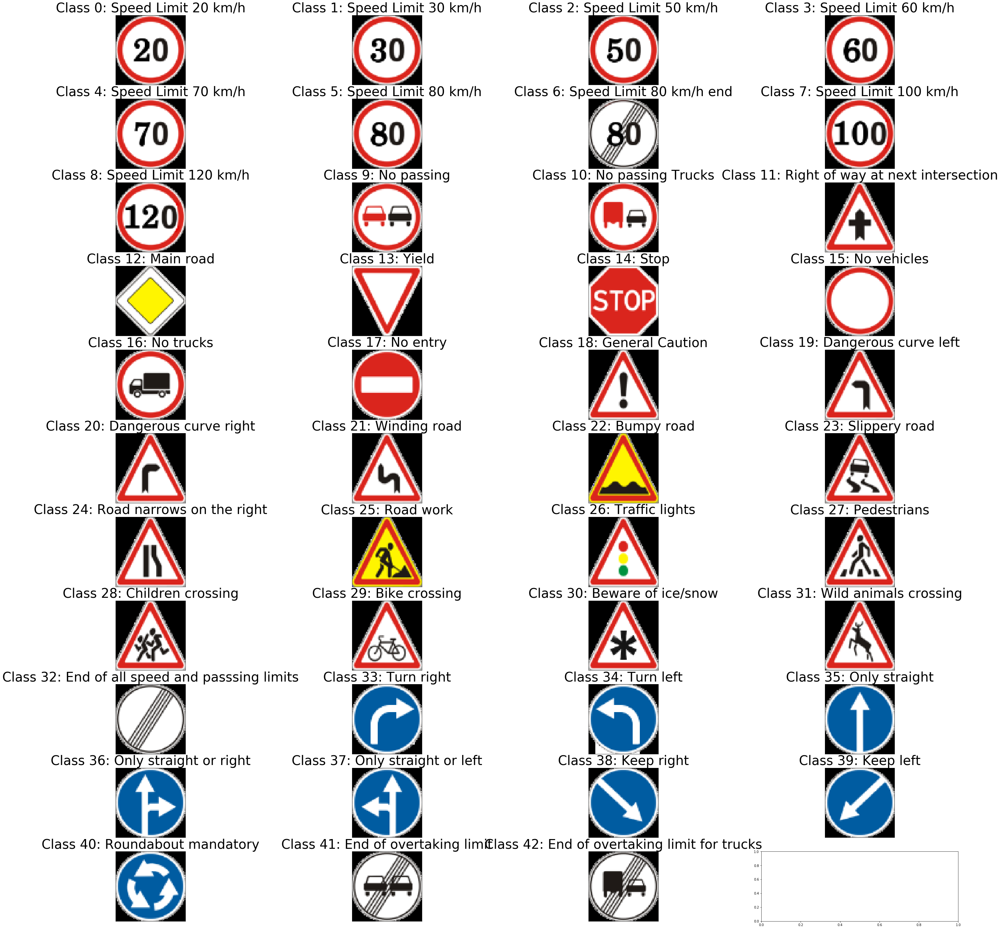

In [16]:
# Visualize classes of symbols in this dataset from the metadata, sorted by class ID
visualize_inputs(meta_df)

40 samples


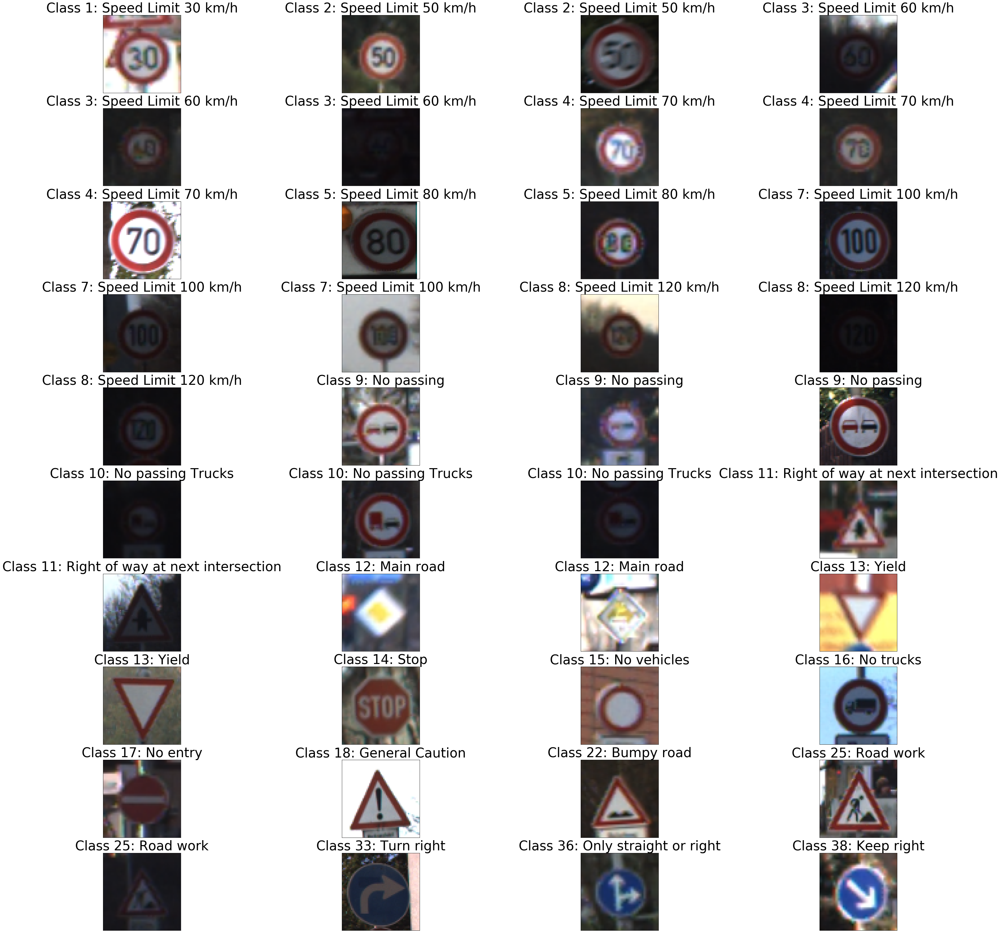

In [17]:
# Visualize training set sample size of 40, before splitting into validation and training sets
visualize_inputs(full_train_df.sample(n=40), count=40)
# I don't want to look at the test set, although possible using visualize_inputs(test_df, count=40)

The images range from bright to dark, grainy to clear, and so on. However, we'll not further preprocess the
images for now because we don't want to learn for example only how the traffic signs would appear on a 
sunny day or in the evening or close up or far away. Let's revisit preprocessing if we need to later. 
Also leaving all images in color rather than grayscale to keep the model robust enough to later on add classes
that may depend on the color of the traffic sign.

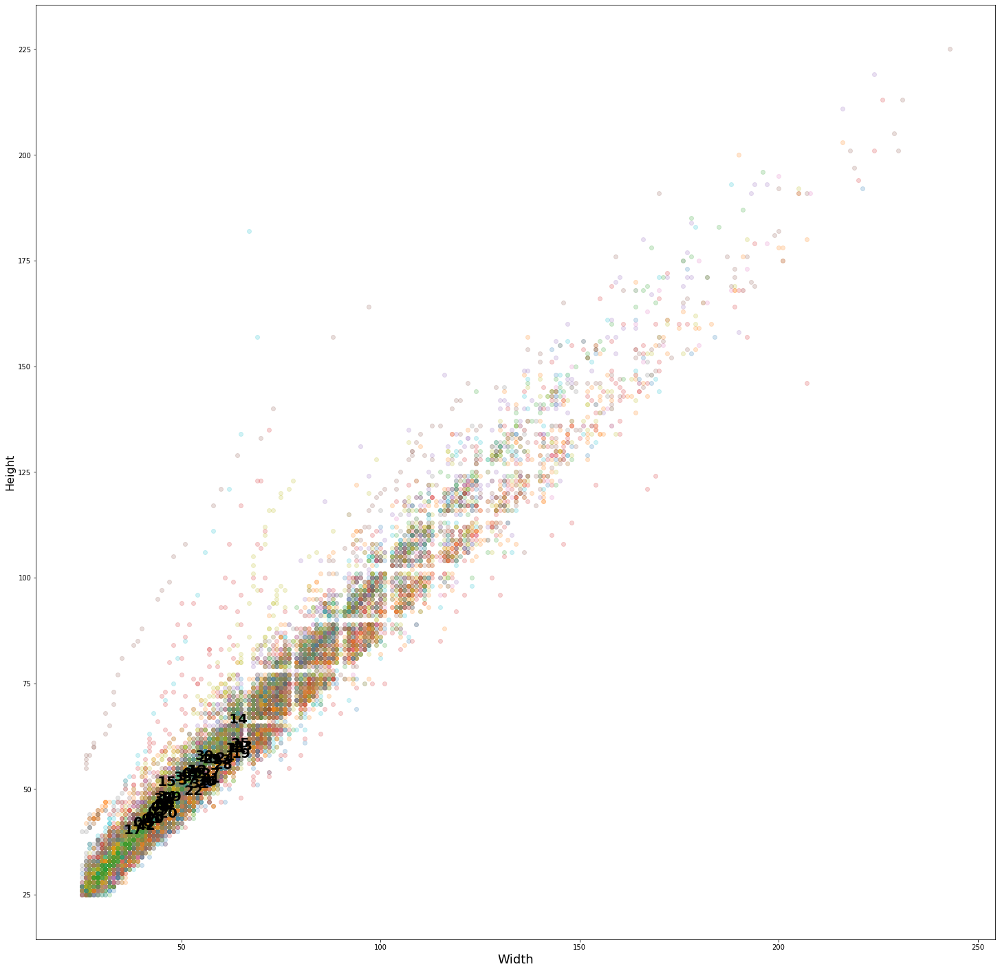

In [18]:
# The training dataset seems to contain a wide range of width and height. To decide the best, let's see if 
# there's clustering of some classes around some image sizes, so that I choose a target width and height 
# which doesn't result in overfitting or underfitting for some classes with certain resolutions

# Create a new figure
plt.figure(figsize=(25,25))

# Loop through classes (calling them labels here because class is a Python keyword) and plot each cluster
for i, label in enumerate(classes_dict.keys()):

    # Add data points 
    plt.scatter(x=full_train_df.loc[full_train_df['ClassId']==label, 'Width'], 
                y=full_train_df.loc[full_train_df['ClassId']==label,'Height'], 
                alpha=0.20)
    plt.xlabel('Width', fontsize=18)
    plt.ylabel('Height', fontsize=16)
    
    # Add class number around the middle of each cluster
    plt.annotate(label, 
                 full_train_df.loc[full_train_df['ClassId']==label,['Width','Height']].mean(),
                 horizontalalignment='center',
                 verticalalignment='center',
                 size=20, weight='bold') 

Visual inspection of the width and height seems to indicate general clustering around width and height of about 50, while specific classes, e.g. 14 (Stop) on the high end and 17 (No Entry) on the low end seem to be on average at the higher and lower ends. We will note these, but for now keep image sizes to have width and height of 50.

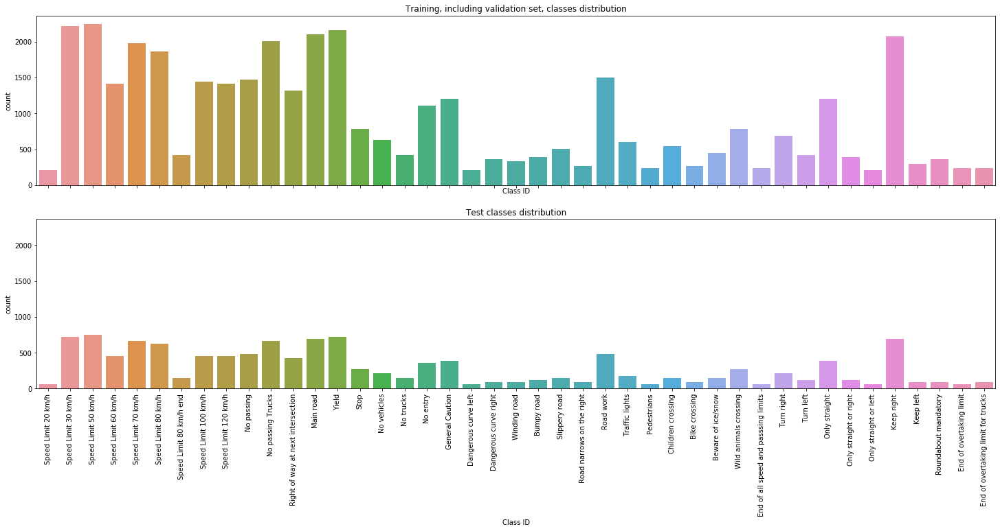

In [19]:
# Curious what the data distribution looks like, for both the training set and the test set

# Visualize distribution of Training and Test dataset across classes
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(25, 10))

axs[0].set_title('Training, including validation set, classes distribution')
axs[0].set_xlabel('Class')
axs[0].set_ylabel('Count')
axs[1].set_title('Test classes distribution')
axs[1].set_xlabel('Class')
axs[1].set_ylabel('Count')

sns.countplot(full_train_df.ClassId, ax=axs[0])
sns.countplot(test_df.ClassId, ax=axs[1])
axs[0].set_xlabel('Class ID');
axs[1].set_xlabel('Class ID');
z = axs[1].set_xticklabels(class_names, rotation=90)


The data set isn't balanced. This could create difficulties in learning and in interpreting accuracy, skewing against classes with small training sample sizes. This does not necessarily imply that there is a problem. Hence, let's proceed and see the results with the data as is, and then consider data augmentation or other approaches to attend to the problem. 

In [20]:
# Splitting into training and validation sets. Ideally would have used the validation_split parameter in
# ImageDataGenerator, but there's some bug/nuance to it which causes it to generate 0 images of some classes. 
(train_df, validation_df) = train_test_split(full_train_df, test_size=0.2, random_state=SEED_VALUE)
train_df.describe()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2
count,31367.000000,31367.000000,31367.000000,31367.000000,31367.000000,31367.000000
mean,50.887398,50.394427,6.005802,5.968725,45.243441,44.788568
std,24.439046,23.245357,1.483817,1.395243,23.180312,22.090992
min,25.000000,25.000000,0.000000,5.000000,20.000000,20.000000
25%,35.000000,35.000000,5.000000,5.000000,29.000000,30.000000
50%,43.000000,43.000000,6.000000,6.000000,38.000000,38.000000
75%,58.000000,58.000000,6.000000,6.000000,53.000000,53.000000
max,230.000000,219.000000,20.000000,19.000000,211.000000,201.000000


In [21]:
# Create class weightage dictionary, useful to create a balanced training set later as needed
classes = np.unique(train_df['ClassId'])
class_weights = class_weight.compute_class_weight('balanced', classes, train_df['ClassId'])
class_weight_dict = dict(zip(classes, class_weights))

class_weight_dict

{'00': 4.394368170355842,
 '01': 0.4177921628173366,
 '02': 0.4057091859171689,
 '03': 0.6542288038377307,
 '04': 0.46760584376863445,
 '05': 0.4773986363082917,
 '06': 2.1581808173936974,
 '07': 0.626688244226005,
 '08': 0.6472627473638596,
 '09': 0.6256133072719294,
 '10': 0.439172255435924,
 '11': 0.6766837813349441,
 '12': 0.44317443273333523,
 '13': 0.4243543433851482,
 '14': 1.1899920330816798,
 '15': 1.4502288594017292,
 '16': 2.0548313134621683,
 '17': 0.8298806783607164,
 '18': 0.7582797466518397,
 '19': 4.530839231547017,
 '20': 2.586755731486063,
 '21': 2.732079087187527,
 '22': 2.3995563035495717,
 '23': 1.8191150031897,
 '24': 3.4571806458723686,
 '25': 0.606876136671439,
 '26': 1.5260776491193928,
 '27': 3.7796120014459573,
 '28': 1.6541159099298635,
 '29': 3.4571806458723686,
 '30': 2.0548313134621683,
 '31': 1.17655663915979,
 '32': 3.665653850648592,
 '33': 1.3238931329928671,
 '34': 2.197184085177921,
 '35': 0.7474027830728174,
 '36': 2.35311327831958,
 '37': 4.475246

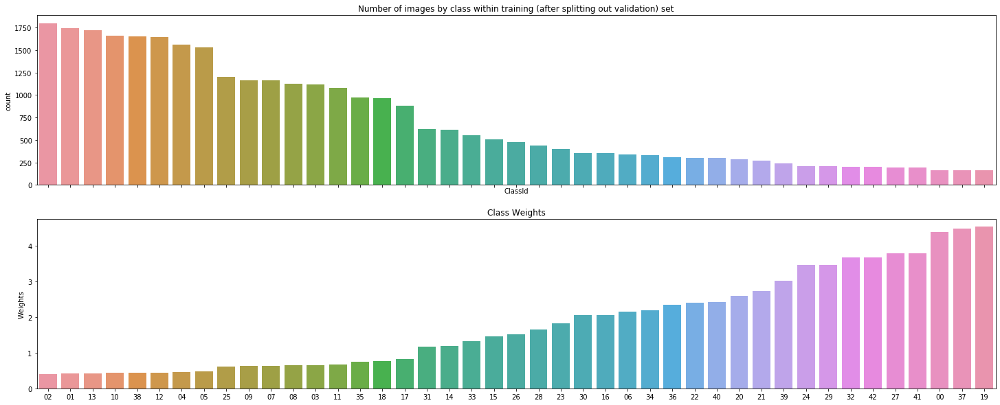

In [22]:
# Visualize class weights from the given training set after splitting into training and validation
f, ax = plt.subplots(2, 1, sharex=True, sharey=False, figsize=(25, 10))

order_by_class_size = train_df.ClassId.value_counts().index

sns.countplot(x='ClassId', data=train_df, ax=ax[0], order=order_by_class_size)
ax[0].set_title('Number of images by class within training (after splitting out validation) set')

df_class_weights = pd.DataFrame.from_dict(class_weight_dict, orient='index', columns=['Weights'])
sns.barplot(x=df_class_weights.index, y=df_class_weights['Weights'], ax=ax[1], order=order_by_class_size)
ax[1].set_title('Class Weights')

plt.show()

,count,class
00,166,Speed Limit 20 km/h
01,1746,Speed Limit 30 km/h
02,1798,Speed Limit 50 km/h
03,1115,Speed Limit 60 km/h
04,1560,Speed Limit 70 km/h
05,1528,Speed Limit 80 km/h
06,338,Speed Limit 80 km/h end
07,1164,Speed Limit 100 km/h
08,1127,Speed Limit 120 km/h
09,1166,No passing


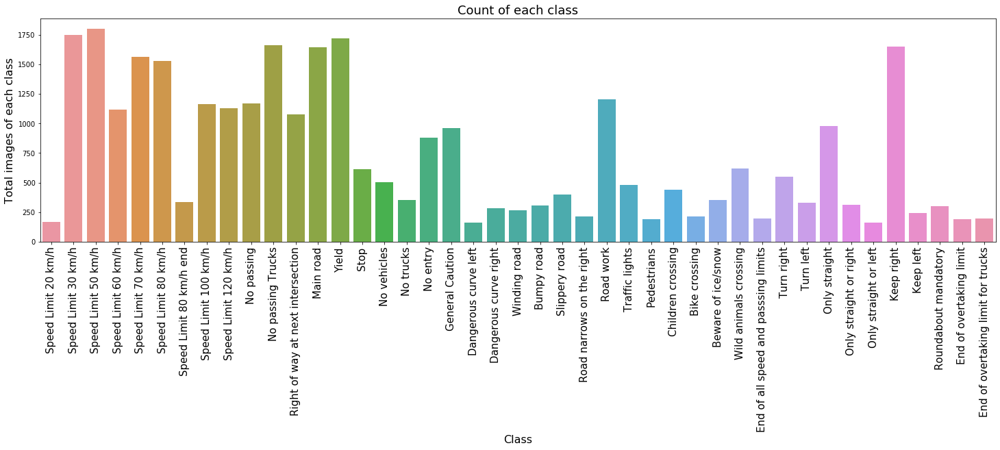

In [23]:
# Understand the distribution of training data across classes after splitting out validation data
train_samples_by_class = train_df['ClassId'].value_counts().sort_index()
train_samples_by_class_df = pd.DataFrame({'count': train_samples_by_class, 'class': class_names})

fig, axs = plt.subplots(1, 1, sharex=False, sharey=False, figsize=(25, 6))

sns.barplot(x='class', y='count', data=train_samples_by_class_df, ax=axs)

axs.set_title('Count of each class', fontsize=18)
axs.set_xlabel('Class', fontsize=16)
axs.set_ylabel('Total images of each class', fontsize=16)
axs.set_xticklabels(rotation=90, labels=class_names, fontsize=15)

train_samples_by_class_df

In [24]:
# Validation data set
validation_df.describe()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2
count,7842.000000,7842.000000,7842.000000,7842.000000,7842.000000,7842.000000
mean,50.629814,50.066947,5.974369,5.937006,45.012752,44.487631
std,23.771573,22.587787,1.441538,1.345299,22.573670,21.484788
min,25.000000,25.000000,3.000000,5.000000,20.000000,20.000000
25%,35.000000,35.000000,5.000000,5.000000,30.000000,30.000000
50%,43.000000,43.000000,6.000000,6.000000,38.000000,38.000000
75%,58.000000,57.000000,6.000000,6.000000,53.000000,52.000000
max,243.000000,225.000000,20.000000,20.000000,223.000000,205.000000


In [25]:
# Use ImageDataGenerators for training and validation
train_datagen = ImageDataGenerator(rescale=1./255.)

In [26]:
# Generic function to create iterators for training and validation from the train_datagen

def create_train_validation_generators(idg, tdf, vdf):    
    tg = idg.flow_from_dataframe(
        dataframe=tdf,
        directory=dataset_dir,
        x_col='Path',
        y_col='ClassId',
        batch_size=BATCH_SIZE,
        seed=SEED_VALUE,
        shuffle=True,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode='rgb',
        class_mode='categorical'
    )

    vg = idg.flow_from_dataframe(
        dataframe=vdf,
        directory=dataset_dir,
        x_col='Path',
        y_col='ClassId',
        batch_size=BATCH_SIZE,
        seed=SEED_VALUE,
        shuffle=True,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode='rgb',
        class_mode='categorical'
    )
    
    return tg, vg

In [27]:
# Iterators without data augmentation
train_generator, validation_generator = create_train_validation_generators(train_datagen, train_df, validation_df)

Found 31367 validated image filenames belonging to 43 classes.
Found 7842 validated image filenames belonging to 43 classes.


In [28]:
# Generic function to get a batch of samples from the generators and display them

def display_imagedatagenerator_samples(idg, max_count=BATCH_SIZE):
    idg.reset()
    
    cols = 4
    rows = math.ceil(max_count / cols) 
    
    x_batch, y_batch = idg.next()
    print("Autogenerated images using ImageDataGenerator")
    print('train y data shape: {}'.format(y_batch.shape))
    print('train x data shape: {}'.format(x_batch.shape))      
        
    fig, axs = plt.subplots(rows, cols, figsize=(64, 64))
    plt.subplots_adjust(left=None, bottom=None, right=None, top=0.9, wspace=None, hspace=None)
    
    idx = 0
    for i in range(rows):
        for j in range(cols):
            if idx <= max_count-1:
                axs[i,j].imshow(x_batch[idx])
                axs[i,j].set_title("Class " + str(int(np.argmax(y_batch[idx]))) + ": " + 
                                   class_names[np.argmax(y_batch[idx])], fontsize=60)
                axs[i,j].get_xaxis().set_visible(False)
                axs[i,j].get_yaxis().set_visible(False)
                idx += 1

    idg.reset()
    
    return (x_batch, y_batch)

Autogenerated images using ImageDataGenerator
train y data shape: (64, 43)
train x data shape: (64, 50, 50, 3)


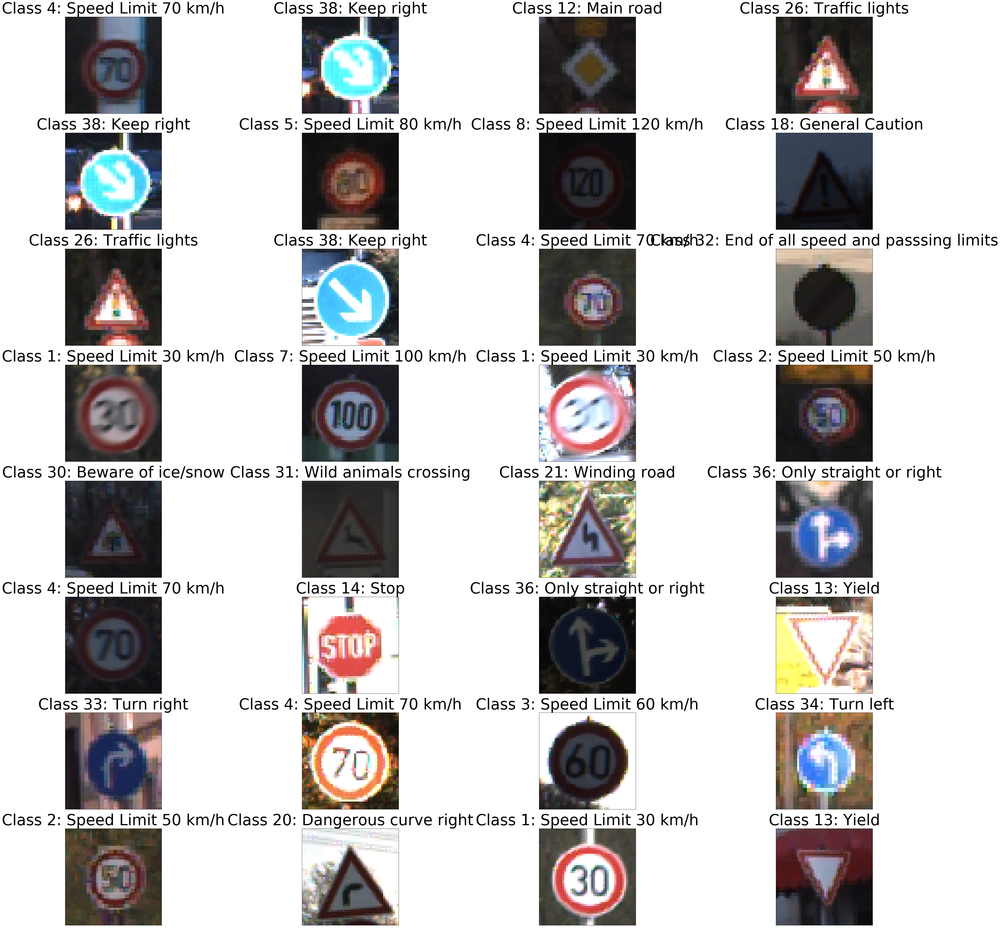

In [29]:
# Visually inspect the training set
(_, _) = display_imagedatagenerator_samples(train_generator, 32)

Autogenerated images using ImageDataGenerator
train y data shape: (64, 43)
train x data shape: (64, 50, 50, 3)


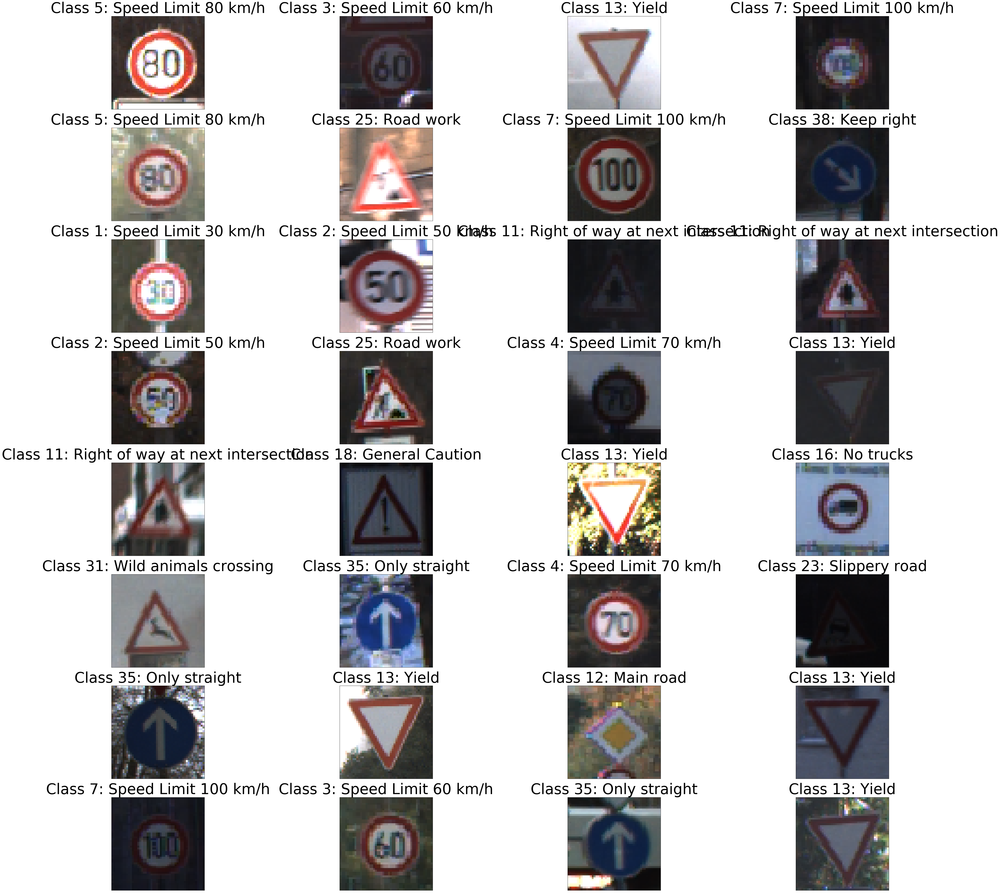

In [30]:
# Visually inspect the validation set 
(_, _) = display_imagedatagenerator_samples(validation_generator,32)

In [31]:
# Generic function to create a simple sequential model for traffic sign detection and identification
# From reading of similar image classifiers, a sequential model is found sufficient

def create_traffic_model_simple(img_width=IMG_WIDTH, img_height=IMG_HEIGHT, num_categories=CLASSES_NUM):
    # Create a convolutional neural network
    model = Sequential([

        # Convolutional layer. 32 filters using a 3x3 kernel
        Conv2D(filters=32, kernel_size=(3, 3), use_bias=False, name='block1_conv2d_1', padding='same',
              input_shape=(img_width, img_height, 3)),
        BatchNormalization(name='block1_batchnorm_1'),
        Activation("relu", name='block1_activation_1'),
        Conv2D(filters=32, kernel_size=(3, 3), use_bias=False, name='block1_conv2d_2', padding='same'),
        BatchNormalization(name='block1_batchnorm_2'),
        Activation("relu", name='block1_activation_2'),
        # Max-pooling layer, using 2x2 pool size
        MaxPooling2D(pool_size=(2, 2), name='block1_maxpool2d_1'),

        Conv2D(filters=64, kernel_size=(3, 3), use_bias=False, name='block2_conv2d_1', padding='same'),
        BatchNormalization(name='block2_batchnorm_1'),
        Activation("relu", name='block2_activation_1'),
        Conv2D(filters=64, kernel_size=(3, 3), use_bias=False, name='block2_conv2d_2', padding='same'),
        BatchNormalization(name='block2_batchnorm_2'),
        Activation("relu", name='block2_activation_2'),
        MaxPooling2D(pool_size=(2, 2), name='block2_maxpool2d_1'),

        Conv2D(filters=128, kernel_size=(3, 3), use_bias=False, name='block3_conv2d_1', padding='same'), 
        BatchNormalization(name='block3_batchnorm_1'),
        Activation("relu", name='block3_activation_1'),        
        Conv2D(filters=128, kernel_size=(3, 3), use_bias=False, name='block3_conv2d_2', padding='same'), 
        BatchNormalization(name='block3_batchnorm_2'),
        Activation("relu", name='block3_activation_2'),
        MaxPooling2D(pool_size=(2, 2), name='block3_maxpool2d_1'),
        
        # Per http://publications.lib.chalmers.se/records/fulltext/238914/238914.pdf using dropouts alone gets 
        # best results, so using this instead of combinations of regularizers
        Dropout(rate=0.25, name='dropout_1_25'),
        
        # Flatten units
        Flatten(name='flatten_1'),

        # Add a hidden layer with dropout, as classes have a wide range of taining images, and we don't want 
        # clustering of around random incidental groupings of images to cause overfitting with some classes.
        Dense(units=128, use_bias=False, name='dense_1_128'),
        BatchNormalization(),
        Activation("relu"),
        
        Dropout(rate=0.5, name='dropout_2_50'),

        # Add an output layer ith the number of classe
        Dense(units=num_categories, activation="softmax", name='dense_2_categories')
    ])
    
    return model

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv2d_1 (Conv2D)     (None, 50, 50, 32)        864       
_________________________________________________________________
block1_batchnorm_1 (BatchNor (None, 50, 50, 32)        128       
_________________________________________________________________
block1_activation_1 (Activat (None, 50, 50, 32)        0         
_________________________________________________________________
block1_conv2d_2 (Conv2D)     (None, 50, 50, 32)        9216      
_________________________________________________________________
block1_batchnorm_2 (BatchNor (None, 50, 50, 32)        128       
_________________________________________________________________
block1_activation_2 (Activat (None, 50, 50, 32)        0         
_________________________________________________________________
block1_maxpool2d_1 (MaxPooli (None, 25, 25, 32)        0

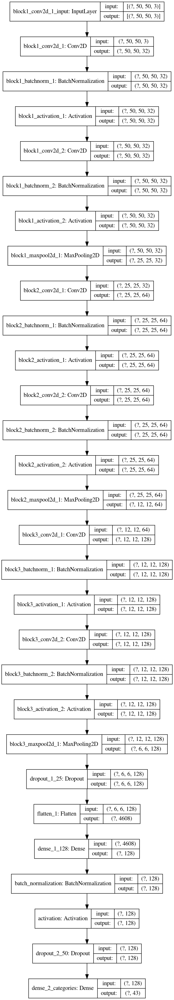

In [32]:
# Create the traffic model and see what it looks like 
traffic_model = create_traffic_model_simple()
traffic_model.compile(optimizer="adam", 
                      loss="categorical_crossentropy", # for the more than binary classifier
                      metrics=["accuracy"]) 

traffic_model.summary()

plot_model(traffic_model, show_shapes=True, expand_nested=True)

In [33]:
# Set up parameters for training and validation in the fit function
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

In [34]:
# We are going to set up a large number of epochs with early stopping
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto')
EPOCHS = 50

history = traffic_model.fit(train_generator,
                            validation_data=validation_generator,
                            steps_per_epoch=STEP_SIZE_TRAIN,
                            validation_steps=STEP_SIZE_VALID,
                            epochs=EPOCHS,
                            callbacks=[early_stopping]
                           )

traffic_model.save('traffic_model.h5')

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 490 steps, validate for 122 steps
Epoch 1/50
490/490 [==============================] - 15s 31ms/step - loss: 0.9540 - accuracy: 0.7692 - val_loss: 0.0881 - val_accuracy: 0.9882
Epoch 2/50
490/490 [==============================] - 10s 20ms/step - loss: 0.0972 - accuracy: 0.9829 - val_loss: 0.0168 - val_accuracy: 0.9963
Epoch 3/50
490/490 [==============================] - 10s 21ms/step - loss: 0.0404 - accuracy: 0.9934 - val_loss: 0.0126 - val_accuracy: 0.9973
Epoch 4/50
490/490 [==============================] - 11s 22ms/step - loss: 0.0335 - accuracy: 0.9935 - val_loss: 0.0149 - val_accuracy: 0.9963
Epoch 5/50
490/490 [==============================] - 11s 22ms/step - loss: 0.0245 - accuracy: 0.9948 - val_loss: 0.0207 - val_accuracy: 0.9942
Epoch 6/50
490/490 [==============================] - 11s 23ms/step - loss: 0.0202 - accuracy: 0.9957 - val_loss: 0.0136 - val_accuracy: 0.9967
Epoch 7/50
490/490 [======================

The above message saying -    
WARNING:tensorflow:sample_weight modes were coerced from ...  
Per
https://stackoverflow.com/questions/59317919/warningtensorflowsample-weight-modes-were-coerced-from-to
"This bug seems to have been fixed in TensorFlow 2.2"

In [35]:
print("Default learning rate: ", K.eval(traffic_model.optimizer.lr))

Default learning rate:  0.001


In [36]:
# Convert history into dataframe for easy plotting
h_df = pd.DataFrame(history.history)
h_df

,loss,accuracy,val_loss,val_accuracy
0,0.951836,0.769223,0.088105,0.988217
1,0.096983,0.982941,0.016813,0.996286
2,0.040368,0.993419,0.012571,0.997310
3,0.033573,0.993483,0.014871,0.996286
4,0.024571,0.994761,0.020716,0.994237
5,0.020110,0.995655,0.013592,0.996670
6,0.019801,0.995400,0.013768,0.995389
7,0.017968,0.995560,0.008220,0.997439
8,0.014460,0.996486,0.007987,0.997695
9,0.009543,0.997636,0.007821,0.998207


In [37]:
# Generic function for plotting, assuming we'll have to do this again if this model doesn't work out or to 
# experiment with changes

def plot_history(h):
    print(h.history.keys())

    h_df = pd.DataFrame(h.history)
    
    f, ax = plt.subplots(1, 2, figsize=(15, 5))

    ax[0].plot(h.history['loss'])
    ax[0].plot(h.history['val_loss'])
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Loss')
    ax[0].legend(('train_loss', 'val_loss'))

    ax[1].plot(h.history['accuracy'])
    ax[1].plot(h.history['val_accuracy'])
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Accuracy')
    ax[1].legend(('train_accuracy', 'val_accuracy'))

    plt.show()


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


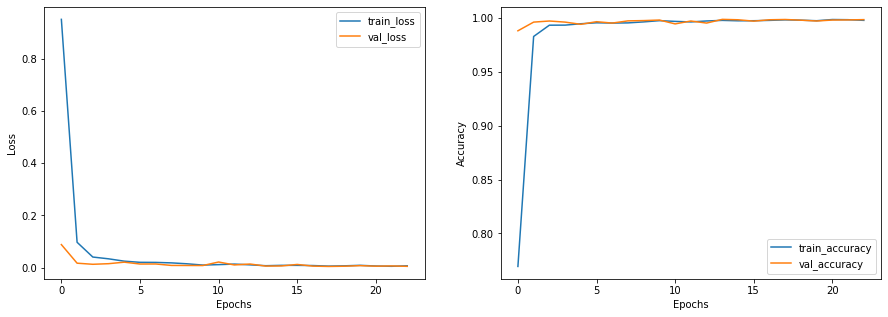

In [38]:
plot_history(history)

The training and validation accuracy on first attempt are very decent, at 99%. Possibly overfitted due to training and validation sets coming from the same larger pool of data. Let's see if the test set makes a difference in accuracy.

In [39]:
# Creating a test generator similar to the training and validation generator

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
        test_df,
        directory=dataset_dir,
        x_col='Path',
        y_col='ClassId',
        batch_size=BATCH_SIZE,
        seed=SEED_VALUE,
        shuffle=False,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode='rgb',
        class_mode="categorical"
)


Found 12630 validated image filenames belonging to 43 classes.


Autogenerated images using ImageDataGenerator
train y data shape: (64, 43)
train x data shape: (64, 50, 50, 3)


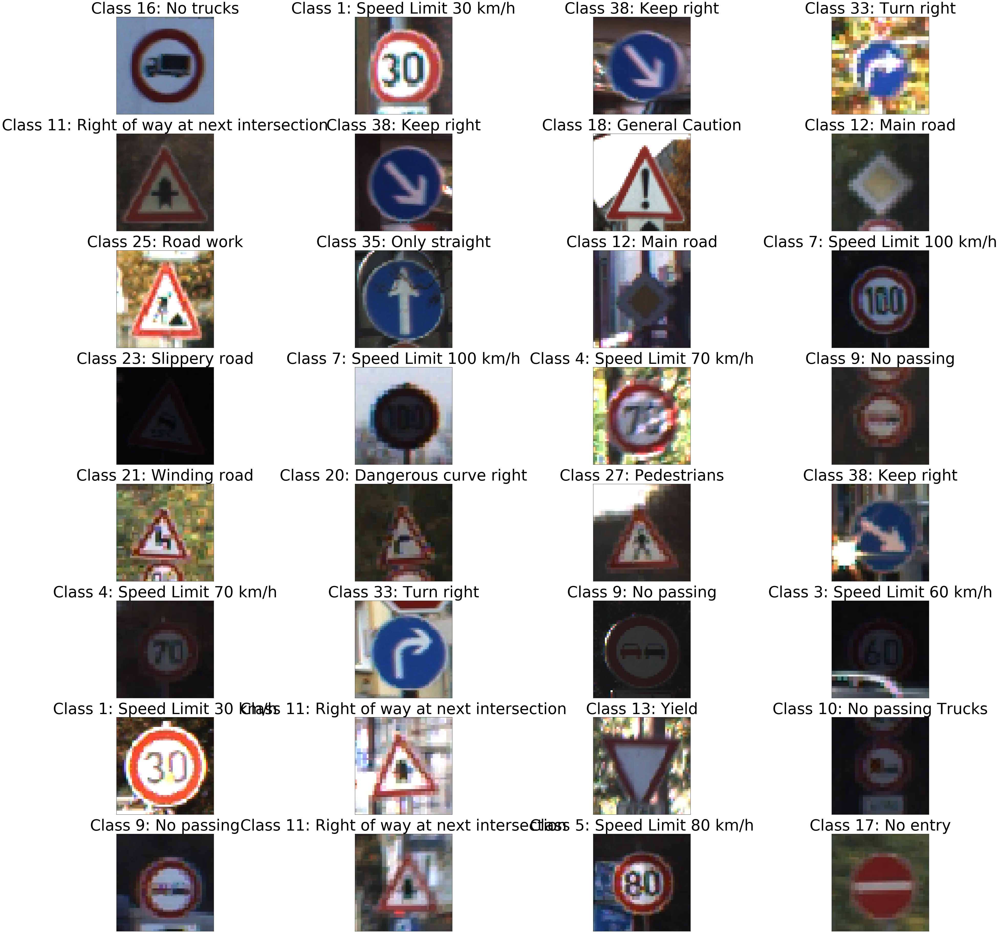

In [40]:
# Let's visually inspect the test set
(x_test_batch, y_test_batch) = display_imagedatagenerator_samples(test_generator, 32)

In [41]:
# Evaluate the simple model against the test set
test_generator.reset()
score = traffic_model.evaluate(test_generator, verbose=1)
print('Test dataset accuracy: {}'.format(score[1]))


  ...
    to  
  ['...']
198/198 [==============================] - 5s 26ms/step - loss: 0.0476 - accuracy: 0.9873
Test dataset accuracy: 0.987331748008728


While the accuracy is not as high in the 99% with the test set, it is still decent enough at about 2% below. 

However, what does accuracy mean here?

Interpreting Accuracy is not as straightforward, as it depends on the dataset. Hence taking another path to evaluate Precision and Recall too. 
From https://blog.exsilio.com/all/accuracy-precision-recall-f1-score-interpretation-of-performance-measures/

Understanding Model Accuracy

True Positives (TP) - The correctly predicted positive values which means that the value of actual class is yes and the value of predicted class is also yes. 

True Negatives (TN) - These are the correctly predicted negative values which means that the value of actual class is no and value of predicted class is also no. 

False positives and false negatives - These values occur when your actual class contradicts with the predicted class.

False Positives (FP) – When actual class is no and predicted class is yes.

False Negatives (FN) – When actual class is yes but predicted class in no.

We can calculate Accuracy, Precision, Recall and F1 score using the above -

Accuracy - The ratio of correctly predicted observation to the total observations. Accuracy is a great measure but only for symmetric datasets where values of FP and FN are almost same. Therefore, you have to look at other parameters to evaluate the performance of your model.

Accuracy = (TP+TN)/(TP+FP+FN+TN)

Precision - The ratio of correctly predicted positive observations to the total predicted positive observations. High precision relates to the low FP rate.

Precision = TP/(TP+FP)

Recall (Sensitivity) - The ratio of correctly predicted positive observations to the all observations in actual class.

Recall = TP/(TP+FN)

F1 score - The weighted average of Precision and Recall. Therefore, this score takes both false positives and false negatives into account. Intuitively it is not as easy to understand as accuracy, but F1 is usually more useful than accuracy, especially if you have an uneven class distribution. Accuracy works best if false positives and false negatives have similar cost. If the cost of FP and FN are very different, it’s better to look at both Precision and Recall.

F1 Score = 2*(Recall * Precision) / (Recall + Precision)


In [42]:
# Generic function to print out precision, recall, f1-score and support (size of data per class)
def display_precision_recall_accuracy_report(tdf, tg, model): 
    tg.reset()

    pred = model.predict(tg)
    pred = np.argmax(pred, axis=1)

    # https://github.com/keras-team/keras/blob/master/keras/preprocessing/image.py#L521-L526
    generator_idx_to_label_map = {v: k for k, v in tg.class_indices.items()}
    
    measures_by_class_str = classification_report(tg.classes, pred, 
                                                  target_names=list(generator_idx_to_label_map.values()))
    
    measures_by_class = classification_report(test_generator.classes, pred, 
                                              target_names=list(generator_idx_to_label_map.values()), 
                                              output_dict=True)

    class_ids = []
    precisions = []
    recalls = []
    f1_scores = []
    supports = []

    for class_id, measures in measures_by_class.items():
        if (class_id.isdigit()):
            class_ids.append(class_id)
            precisions.append(measures['precision'])
            recalls.append(measures['recall'])
            f1_scores.append(measures['f1-score'])
            supports.append(measures['support'])

    df_report = pd.DataFrame(list(zip(class_ids, precisions, recalls, f1_scores, supports)),
                   index=class_ids,
                   columns=['ClassId', 'Precision', 'Recall', 'F1-score', 'Support'])
    
    cm = confusion_matrix(test_generator.classes, pred)
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    df_report['Accuracy'] = pd.Series(cm.diagonal(), index=list(generator_idx_to_label_map.values()))

    # Verifying that the dataframe contains accuracy numbers too.
    print(df_report.reindex(df_report.ClassId.astype(int).sort_values().index).reset_index(drop=True))
    
    # Plot 
    f, ax = plt.subplots(3, 1, sharex=True, sharey=False, figsize=(25, 10))

    order_by_class_size = tdf.ClassId.value_counts().index

    sns.barplot(x=df_report.index, y=df_report['Accuracy'], ax=ax[0], order=order_by_class_size)
    ax[0].set_title('Accuracy by class')

    sns.barplot(x=df_report.index, y=df_report['F1-score'], ax=ax[1], order=order_by_class_size)
    ax[1].set_title('F1-score by class')
    
    sns.countplot(x='ClassId', data=tdf, ax=ax[2], order=order_by_class_size)
    ax[2].set_title('Support')

    plt.show()

   ClassId  Precision    Recall  F1-score  Support  Accuracy
0       00   1.000000  1.000000  1.000000       60  1.000000
1       01   0.995822  0.993056  0.994437      720  0.993056
2       02   0.997337  0.998667  0.998001      750  0.998667
3       03   0.995423  0.966667  0.980834      450  0.966667
4       04   0.995455  0.995455  0.995455      660  0.995455
5       05   0.963190  0.996825  0.979719      630  0.996825
6       06   1.000000  0.953333  0.976109      150  0.953333
7       07   0.993289  0.986667  0.989967      450  0.986667
8       08   0.995413  0.964444  0.979684      450  0.964444
9       09   0.950495  1.000000  0.974619      480  1.000000
10      10   1.000000  0.998485  0.999242      660  0.998485
11      11   0.988180  0.995238  0.991696      420  0.995238
12      12   1.000000  1.000000  1.000000      690  1.000000
13      13   0.995845  0.998611  0.997226      720  0.998611
14      14   1.000000  1.000000  1.000000      270  1.000000
15      15   0.995261  1

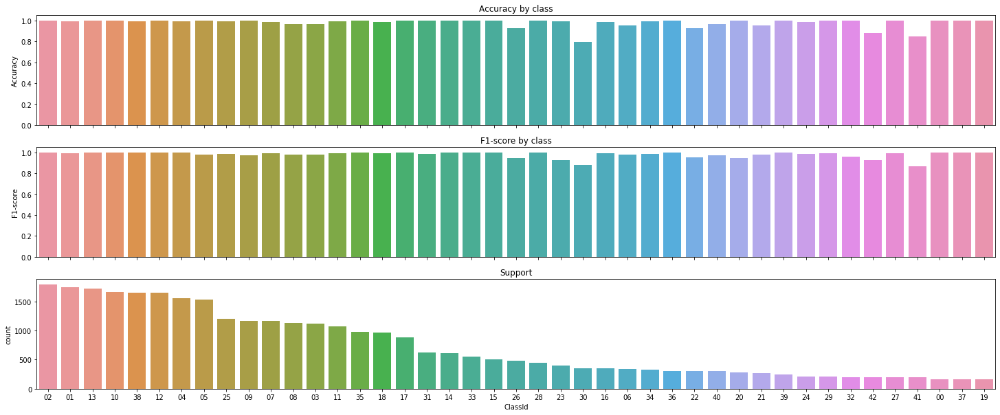

In [43]:
display_precision_recall_accuracy_report(train_df, test_generator, traffic_model)

Visually inspecting the above graph, it looks like while classes with smaller sample sizes also have high accuracy
and F1, the smaller classes seem to have greater variation. We will have to run more examples to prove and address this. For example, class 27 is pedestrians. We don't want our autonomous cars hitting pedestrians. Let's inspect the actual images and look at what was the actual class and what the model predicted.

Autogenerated images using ImageDataGenerator
train y data shape: (64, 43)
train x data shape: (64, 50, 50, 3)


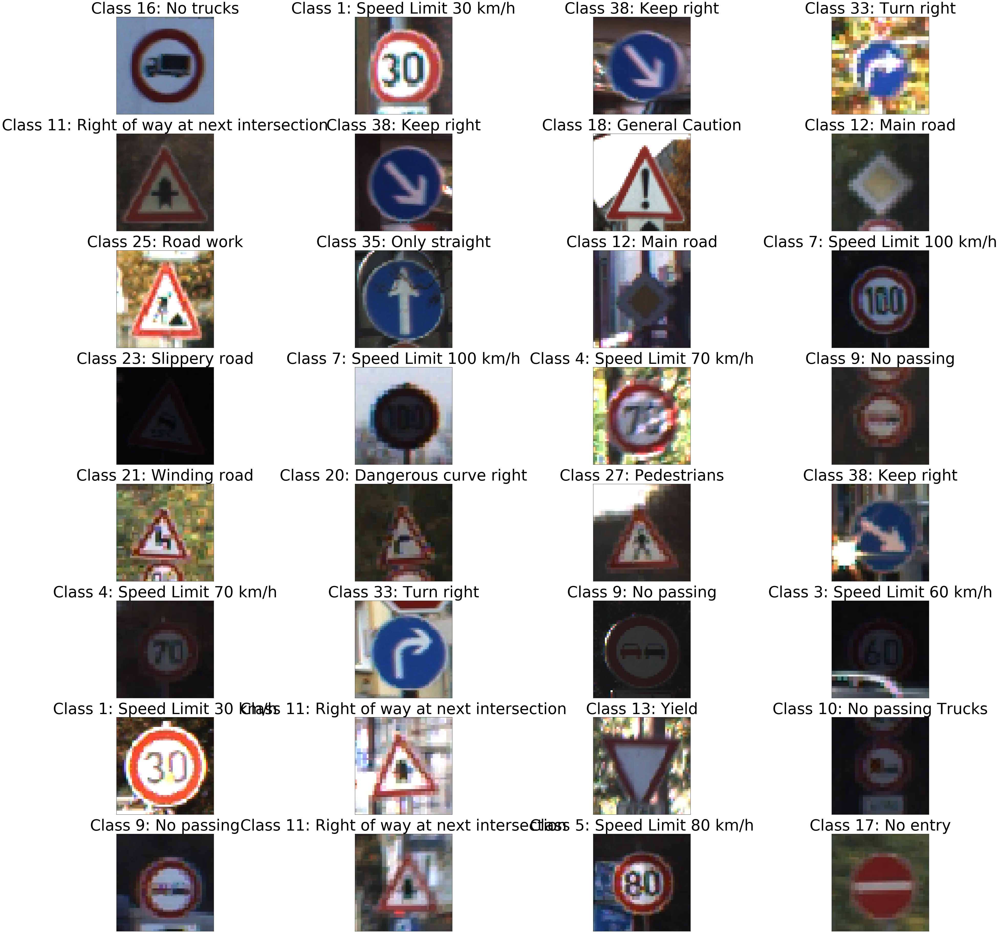

In [44]:
# Get another batch of samples from the test generator
(x_test_batch, y_test_batch) = display_imagedatagenerator_samples(test_generator, 32)

In [45]:
y_predictions_batch = traffic_model.predict(x_test_batch)

In [46]:
# Prep data to compare Predictions against Ground Truth
random_test_results = []

for i in range(BATCH_SIZE):
    prediction = np.argmax(y_predictions_batch[i])
    sample_result = {'image': x_test_batch[i], 
                   'prediction': int(prediction), 
                   'groundtruth': int(np.argmax(y_test_batch[i]))}
    random_test_results.append(sample_result)
    
random_test_results_df = pd.DataFrame(random_test_results)

random_test_results_df.head()


,image,prediction,groundtruth
0,"[[[0.45098042, 0.5411765, 0.6784314], [0.45490...",16,16
1,"[[[0.21568629, 0.27058825, 0.2392157], [0.3215...",1,1
2,"[[[0.19607845, 0.14901961, 0.14117648], [0.196...",38,38
3,"[[[0.5176471, 0.4901961, 0.34117648], [0.51764...",33,33
4,"[[[0.14901961, 0.13725491, 0.121568635], [0.14...",11,11


In [47]:
def display_predicted_vs_groundtruth(r_df, num=BATCH_SIZE):
    # Let's see what the images look like, what's predicted and the ground truth. 
    cols = 4
    rows = math.ceil(num/cols)
    fig, axs = plt.subplots(rows, cols, figsize=(25, 8))

    idx = 0
    for i in range(rows):
        for j in range(cols):       
            groundtruth = r_df.iloc[idx]['groundtruth']
            prediction = r_df.iloc[idx]['prediction']

            axs[i,j].imshow(r_df.iloc[idx]['image'])
            axs[i,j].set_title('Predicted: {}\nGround truth: {}'.format(class_names[prediction], 
                                                                        class_names[groundtruth]), fontsize=14)
            axs[i,j].get_xaxis().set_visible(False)
            axs[i,j].get_yaxis().set_visible(False)
            idx += 1

    fig.suptitle("Sample of Test Predictions", fontsize=30, y=2.1, x=0.515);
    plt.subplots_adjust(left=None, bottom=None, right=0.9, top=1.9, wspace=None, hspace=None)

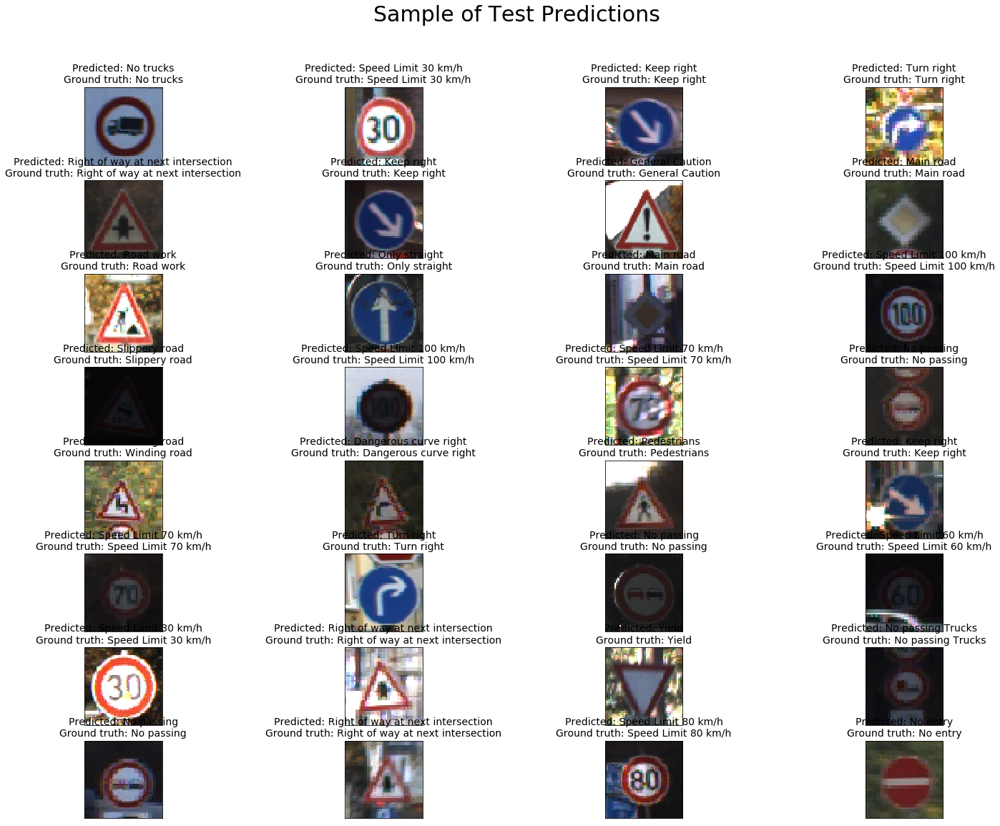

In [48]:
display_predicted_vs_groundtruth(random_test_results_df, 32)

We are not seeing any wrong predictions here, so let's take a much larger test set, perhaps the full test set and evaluate the Correct and Wrong predictions to see what's going well or not.

In [49]:
# Let's take the complete large test set
full_test_datagen = ImageDataGenerator(rescale=1./255)

full_test_generator = full_test_datagen.flow_from_dataframe(
        test_df,
        directory=dataset_dir,
        x_col='Path',
        y_col='ClassId',
        batch_size=test_df.shape[0], # taking the complete test set here
        seed=SEED_VALUE,
        shuffle=False,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode='rgb',
        class_mode="categorical"
)

Found 12630 validated image filenames belonging to 43 classes.


In [50]:
# Now using the x and y for this test set, get predictions
(full_x_test_batch, full_y_test_batch) = full_test_generator.next()

full_y_predictions_batch = traffic_model.predict(full_x_test_batch)

full_y_predictions_batch.shape

(12630, 43)

In [51]:
# Mark the correct and wrong predictions, then move into a dataframe for easier manipulation and plotting
full_test_results = []

for i in range(test_df.shape[0]):
    prediction = np.argmax(full_y_predictions_batch[i])
    groundtruth = np.argmax(full_y_test_batch[i])
    sample_result = {'image': full_x_test_batch[i], 
                   'prediction': int(prediction), 
                   'groundtruth': int(groundtruth),
                   'result': 'Correct' if int(prediction) == int(groundtruth) else 'Wrong'}
    full_test_results.append(sample_result)
    
full_test_results_df = pd.DataFrame(full_test_results)

full_test_results_df.head()


,image,prediction,groundtruth,result
0,"[[[0.45098042, 0.5411765, 0.6784314], [0.45490...",16,16,Correct
1,"[[[0.21568629, 0.27058825, 0.2392157], [0.3215...",1,1,Correct
2,"[[[0.19607845, 0.14901961, 0.14117648], [0.196...",38,38,Correct
3,"[[[0.5176471, 0.4901961, 0.34117648], [0.51764...",33,33,Correct
4,"[[[0.14901961, 0.13725491, 0.121568635], [0.14...",11,11,Correct


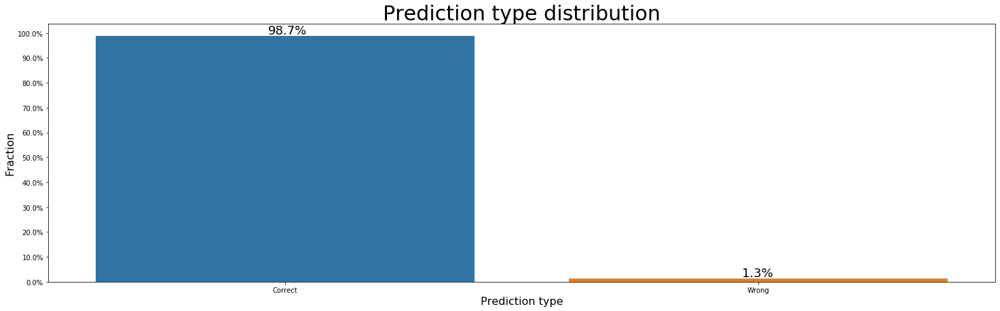

In [52]:
# What % of predictions are wrong?
fig, axs = plt.subplots(1, 1, sharex=False, sharey=True, figsize=(25, 7))

px = sns.countplot(x='result', data=full_test_results_df, ax=axs)
axs.set_title('Prediction type distribution', fontsize=30)
axs.set_xlabel('Prediction type', fontsize=16)
axs.set_ylabel('Fraction', fontsize=16);


total = full_test_results_df.shape[0]
for idx, p in enumerate(px.patches):
        px.annotate('{:.1f}%'.format(p.get_height()/total*100), (p.get_x()+0.365, p.get_height()+100), fontsize=18)


px.yaxis.set_ticks(np.linspace(0, total, 11))
px.set_yticklabels(map('{:.1f}%'.format, 100*px.yaxis.get_majorticklocs()/total));

In [70]:
# Generic function to plot comparative distribution of the correct, wrong, train and test 
def plot_correct_wrong_train_test(ftr_df, tdf):

    correct_prediction_by_class = ftr_df[ftr_df['result'] == 'Correct']['groundtruth'].value_counts() / full_test_results_df['groundtruth'].value_counts().sort_index()
    correct_prediction_by_class_df = pd.DataFrame({'accuracy': correct_prediction_by_class, 'class': class_names})

    fig, axs = plt.subplots(1, 1, sharex=False, sharey=False, figsize=(25, 5))

    sns.barplot(x='class', y='accuracy', data=correct_prediction_by_class_df, ax=axs)

    axs.set_title('Correct prediction grouped by class', fontsize=25)
    axs.set_xlabel('Class', fontsize=16)
    axs.set_ylabel('Percent of correct prediction', fontsize=16)
    axs.set_xticklabels(rotation=90, labels=class_names, fontsize=15)


    wrong_prediction_by_class = ftr_df[ftr_df['result'] == 'Wrong']['groundtruth'].value_counts() / full_test_results_df['groundtruth'].value_counts().sort_index()
    wrong_prediction_by_class_df = pd.DataFrame({'error': wrong_prediction_by_class, 'class': class_names})

    fig, axs = plt.subplots(1, 1, sharex=False, sharey=False, figsize=(25, 5))

    sns.barplot(x='class', y='error', data=wrong_prediction_by_class_df, ax=axs)

    axs.set_title('Wrong prediction grouped by class', fontsize=25)
    axs.set_xlabel('Class', fontsize=16)
    axs.set_ylabel('Percent of wrong prediction', fontsize=16)
    axs.set_xticklabels(rotation=90, labels=class_names, fontsize=15)



    test_samples_by_class = ftr_df['groundtruth'].value_counts().sort_index()
    test_samples_by_class_df = pd.DataFrame({'count': test_samples_by_class, 'class': class_names})

    fig, axs = plt.subplots(1, 1, sharex=False, sharey=False, figsize=(25, 5))

    sns.barplot(x='class', y='count', data=test_samples_by_class_df, ax=axs)

    axs.set_title('Test Sample Sizes grouped by class', fontsize=25)
    axs.set_xlabel('Class', fontsize=16)
    axs.set_ylabel('Number of Test Samples', fontsize=16)
    axs.set_xticklabels(rotation=90, labels=class_names, fontsize=15)



    train_samples_by_class = tdf['ClassId'].value_counts().sort_index()
    train_samples_by_class_df = pd.DataFrame({'count': train_samples_by_class, 'class': class_names})

    fig, axs = plt.subplots(1, 1, sharex=False, sharey=False, figsize=(25, 5))

    sns.barplot(x='class', y='count', data=train_samples_by_class_df, ax=axs)

    axs.set_title('Train Sample Sizes grouped by class', fontsize=25)
    axs.set_xlabel('Class', fontsize=16)
    axs.set_ylabel('Number of Train Samples', fontsize=16)
    axs.set_xticklabels(rotation=90, labels=class_names, fontsize=15)

    return test_samples_by_class_df


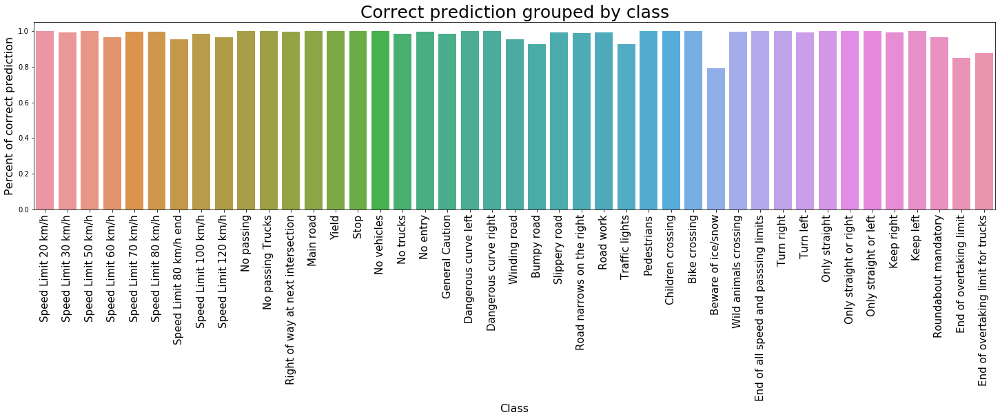

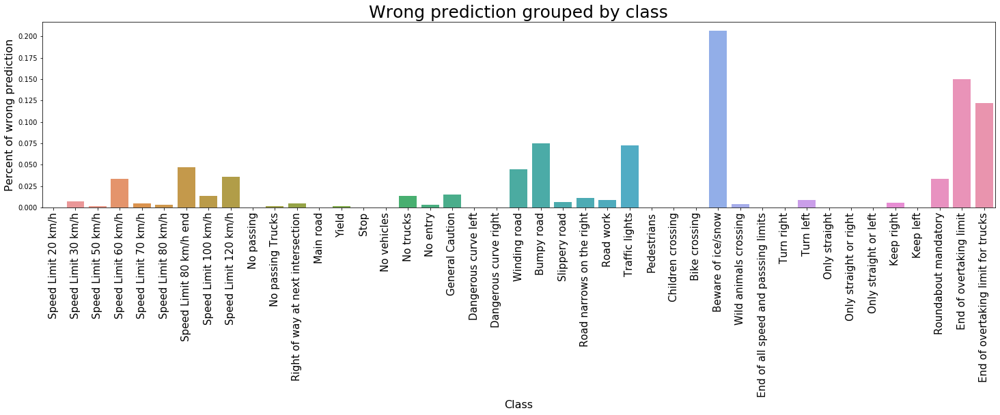

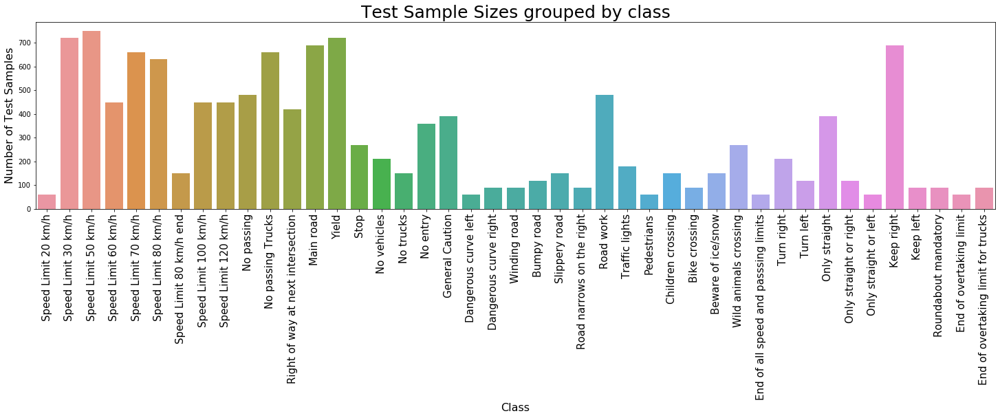

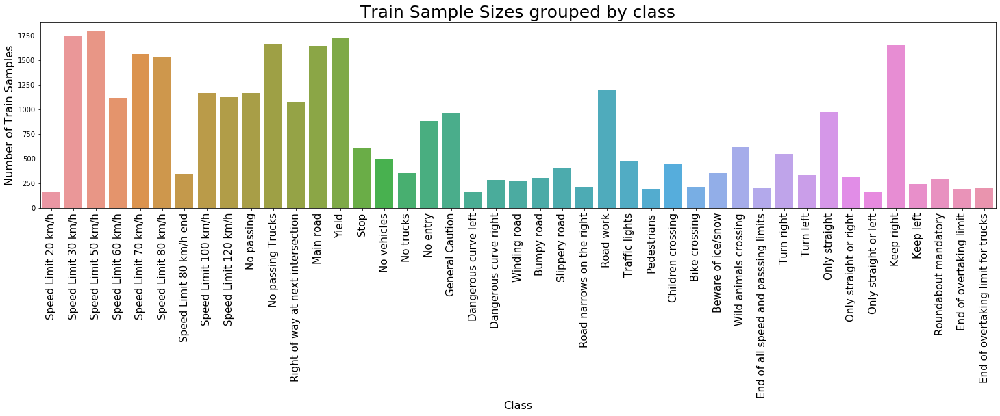

In [71]:
test_samples_by_class_df = plot_correct_wrong_train_test(full_test_results_df, train_df)

In [55]:
# Looking at the actual numbers of the test sample distribution by class
test_samples_by_class_df

,count,class
0,60,Speed Limit 20 km/h
1,720,Speed Limit 30 km/h
2,750,Speed Limit 50 km/h
3,450,Speed Limit 60 km/h
4,660,Speed Limit 70 km/h
5,630,Speed Limit 80 km/h
6,150,Speed Limit 80 km/h end
7,450,Speed Limit 100 km/h
8,450,Speed Limit 120 km/h
9,480,No passing


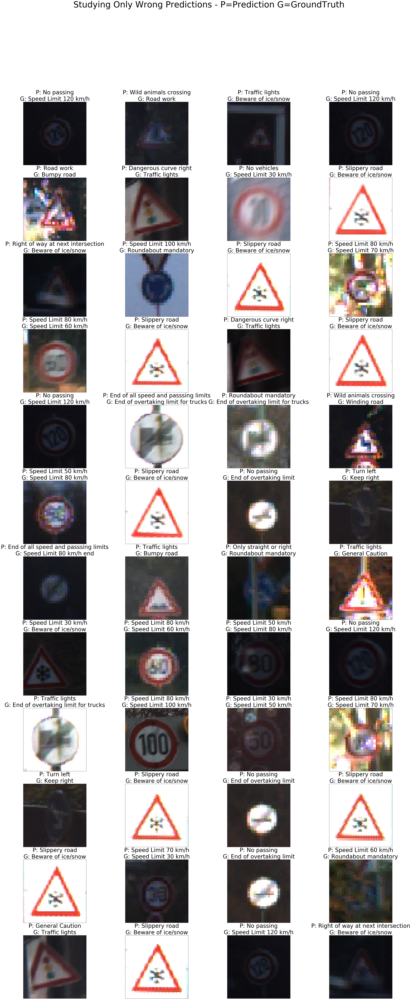

In [56]:
# Wrong predictions only -

rows = 12
cols = 4
fig, axs = plt.subplots(rows, cols, figsize=(IMG_WIDTH, IMG_HEIGHT))

f_df = full_test_results_df[full_test_results_df['result'] == 'Wrong'].copy()

idx = 0
for i in range(rows):
    for j in range(cols):       
        groundtruth = f_df.iloc[idx]['groundtruth']
        prediction = f_df.iloc[idx]['prediction']
        
        axs[i,j].imshow(f_df.iloc[idx]['image'])
        axs[i,j].set_title('P: {}\nG: {}'.format(class_names[prediction], 
                                                                    class_names[groundtruth]), fontsize=40)
        axs[i,j].get_xaxis().set_visible(False)
        axs[i,j].get_yaxis().set_visible(False)
        idx += 1
        
fig.suptitle("Studying Only Wrong Predictions - P=Prediction G=GroundTruth", fontsize=60, y=2.1, x=0.515)
plt.subplots_adjust(left=None, bottom=None, right=0.9, top=1.9, wspace=None, hspace=None)


Something common about many of these images is that they have lighting or clarity differences, or that they are like the pedestrian and the snow signs which have few number of images available for training. 

Options to consider in further improvement upon this project would be to evaluate with grayscale for the lighting variations and with augmentation through ImageDataGenerator to train the model with greater variety of images. 

In [57]:
# Generic function to plot confusion matrix

def plot_confusion_matrix(df):
    cm = confusion_matrix(df['groundtruth'], df['prediction'])

    fig, ax = plt.subplots(1,1, figsize=((20, 20)))

    ax.imshow(cm)

    ax.set_xticks(np.arange(len(class_names)))
    ax.set_yticks(np.arange(len(class_names)))

    ax.set_xticklabels(class_names)
    ax.set_yticklabels(class_names)

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    for i in range(len(class_names)):
        for j in range(len(class_names)):
            ax.text(j, i, cm[i, j], ha="center", va="center", color="w")

    ax.set_title('Confusion matrix', fontsize=30)


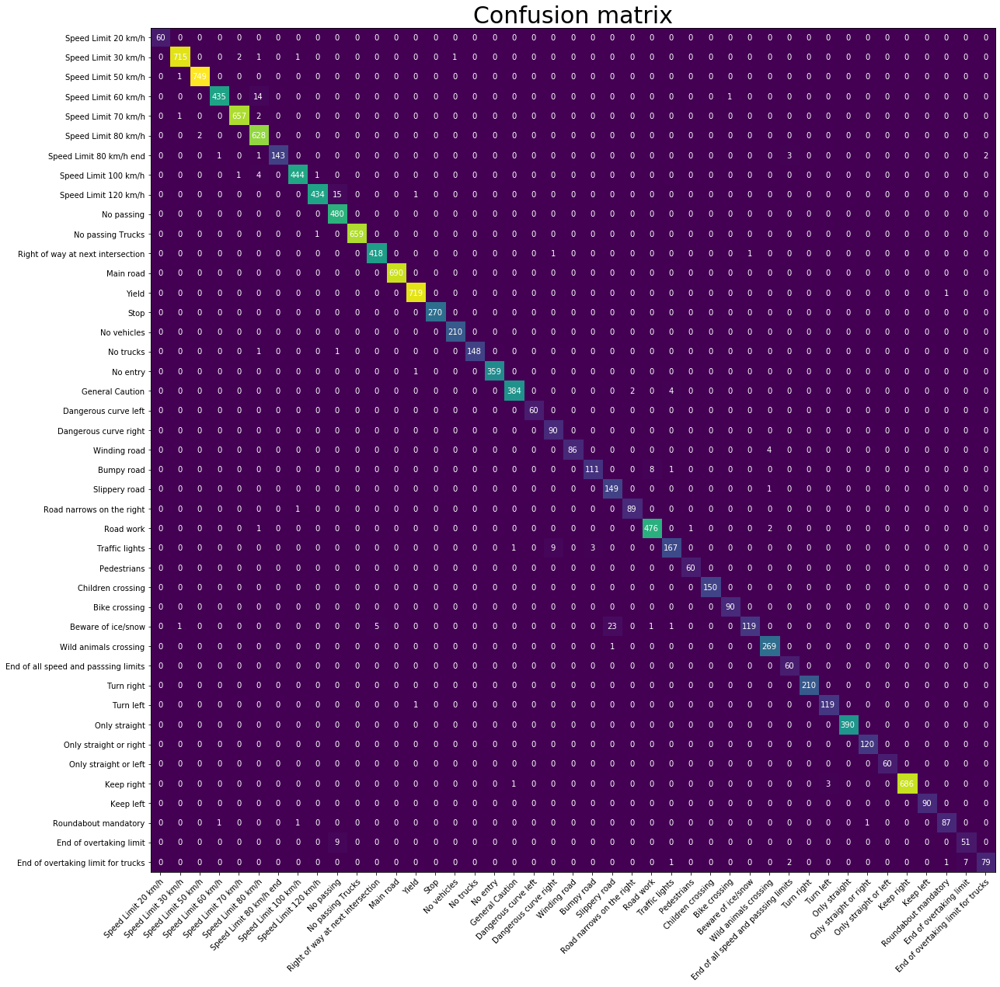

In [58]:
# Let's plot a confusion matrix to summarize where the wrong predictions are happening
plot_confusion_matrix(full_test_results_df)

The benefit of the confusion matrix is to locate not only the wrong predictions, but also about what the wrong predictions think the image should have been classified as. This helps inform the data collection teams to get more samples, not only of the wrongly predicted class, but also variations of the images of the class that the model is confused about. For example, the above CNN thinks that the sign for end of 80km/h speed limit is instead End of all speed and passing limits or End of passing limits for trucks about 1/5th of the time, so we need more labeled data for all 3 classes, showing the difference. 

In [59]:
# Generic function to classify an image, given the model and its filepath
def classify_image(model, img_path, dim_width, dim_height):
    # We preprocess the image into a 4D tensor
    # set_image_dim_ordering() is deprecated in scipy beyond 1.1.
    img = image.load_img(img_path, target_size=(dim_width, dim_height))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    
    img_tensor /= 255.

    print(img_tensor.shape)

    plt.imshow(img_tensor[0])
    plt.show()
    
    # Use the above neural network to classify the image
    predictions = model.predict_classes(img_tensor)
    print('Prediction : ', predictions, class_names[predictions[0]])
    
    return img_tensor

(1, 50, 50, 3)


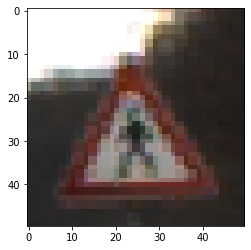

Prediction :  [27] Pedestrians


In [60]:
# Testing classification of pedestrian image
img_path = dataset_dir + 'test/00018.png'
img_tensor = classify_image(traffic_model, img_path, IMG_WIDTH, IMG_HEIGHT)

In [61]:
# While the result is correct, what's going on inside the network? Let's start to visualize. 

# Names of the layers in the model
layer_names = []
for layer in traffic_model.layers:
    layer_names.append(layer.name) 
    
number_of_layers = len(layer_names)
print("Number of layers = ", number_of_layers)

layer_names

Number of layers =  28


['block1_conv2d_1',
 'block1_batchnorm_1',
 'block1_activation_1',
 'block1_conv2d_2',
 'block1_batchnorm_2',
 'block1_activation_2',
 'block1_maxpool2d_1',
 'block2_conv2d_1',
 'block2_batchnorm_1',
 'block2_activation_1',
 'block2_conv2d_2',
 'block2_batchnorm_2',
 'block2_activation_2',
 'block2_maxpool2d_1',
 'block3_conv2d_1',
 'block3_batchnorm_1',
 'block3_activation_1',
 'block3_conv2d_2',
 'block3_batchnorm_2',
 'block3_activation_2',
 'block3_maxpool2d_1',
 'dropout_1_25',
 'flatten_1',
 'dense_1_128',
 'batch_normalization',
 'activation',
 'dropout_2_50',
 'dense_2_categories']

In [62]:
layer_names_conv = [k for k in layer_names if 'conv' in k]
layer_names_conv

['block1_conv2d_1',
 'block1_conv2d_2',
 'block2_conv2d_1',
 'block2_conv2d_2',
 'block3_conv2d_1',
 'block3_conv2d_2']

In [63]:
# Creating a mapping of layer name to layer details
layers_info = {}
for i in traffic_model.layers:
    layers_info[i.name] = i.get_config()
    
layers_info[layer_names[0]]    

{'name': 'block1_conv2d_1',
 'trainable': True,
 'batch_input_shape': (None, 50, 50, 3),
 'dtype': 'float32',
 'filters': 32,
 'kernel_size': (3, 3),
 'strides': (1, 1),
 'padding': 'same',
 'data_format': 'channels_last',
 'dilation_rate': (1, 1),
 'activation': 'linear',
 'use_bias': False,
 'kernel_initializer': {'class_name': 'GlorotUniform',
  'config': {'seed': None}},
 'bias_initializer': {'class_name': 'Zeros', 'config': {}},
 'kernel_regularizer': None,
 'bias_regularizer': None,
 'activity_regularizer': None,
 'kernel_constraint': None,
 'bias_constraint': None}

In [64]:
# The layer_weights dictionary will map every layer_name to its corresponding weights
layer_weights = {}
for i in traffic_model.layers:
    layer_weights[i.name] = i.get_weights()
    
print("Number of layers for which weights are available = ", len(layer_weights))

Number of layers for which weights are available =  28


In [65]:
# Extracts the outputs of the top layers
layer_outputs = [layer.output for layer in traffic_model.layers] 

# Creates a model that will return these outputs, given the model input:
activation_model = Model(inputs=traffic_model.input, outputs=layer_outputs) 

# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

print("Number of activations for which prediction details available = ", len(activations))

Number of activations for which prediction details available =  28


In [66]:
# Generic function to plot activations of a given layer
def plot_each_layer(layername, layeractivation):
    images_per_row = 16

    # This is the number of features in the feature map
    n_features = layeractivation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layeractivation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = math.ceil(n_features // images_per_row)
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layeractivation[0, :, :, col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layername)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
    plt.show()


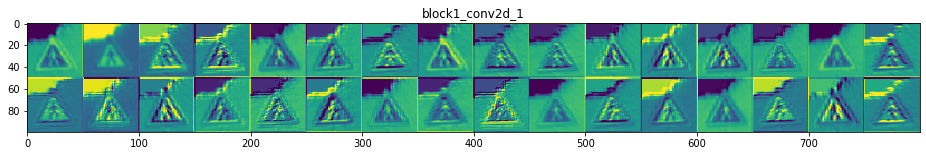

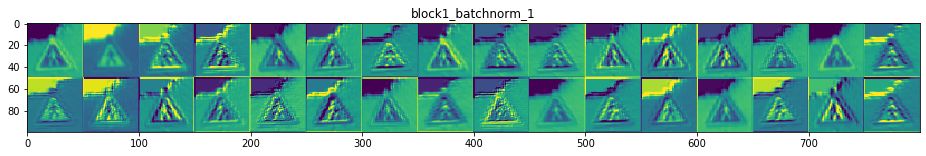

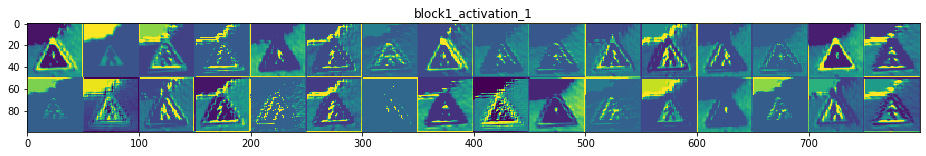

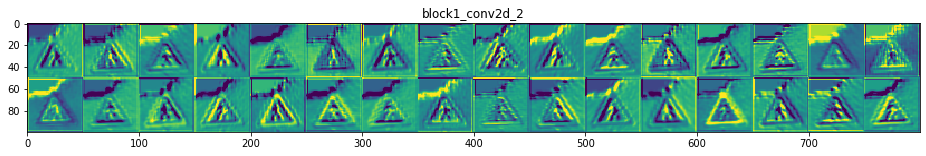

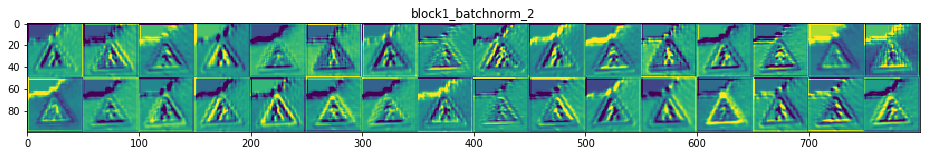

...

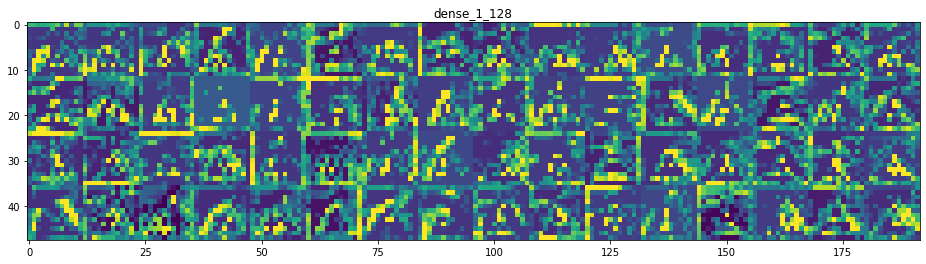

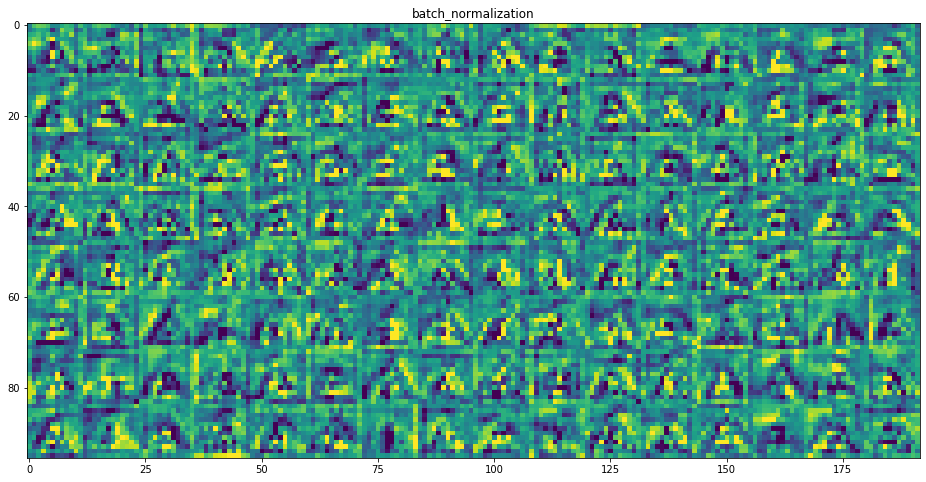

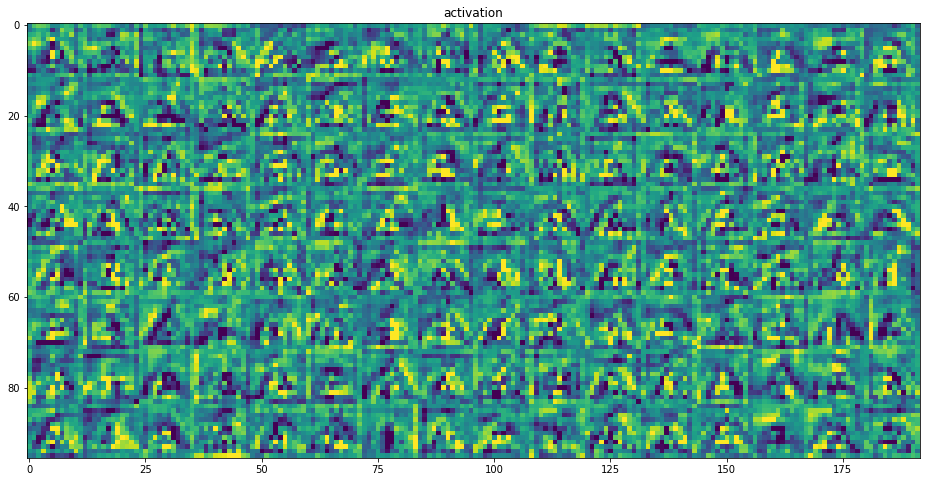

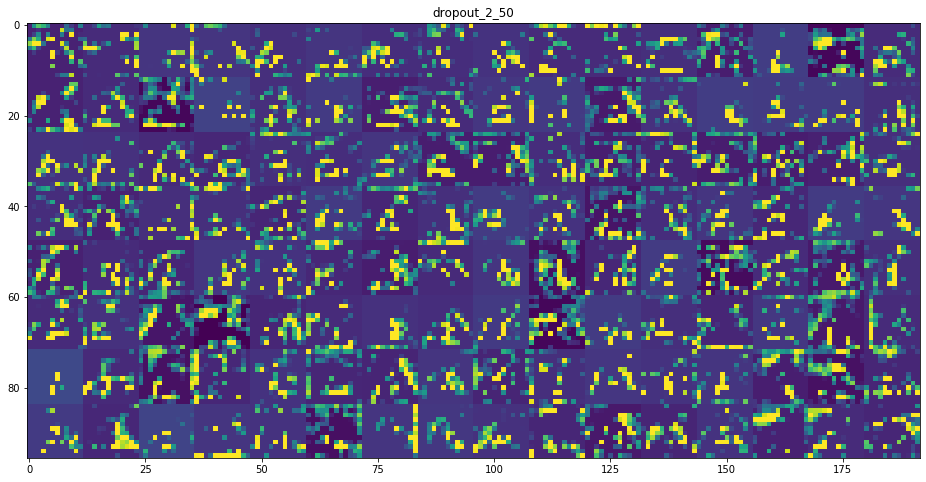

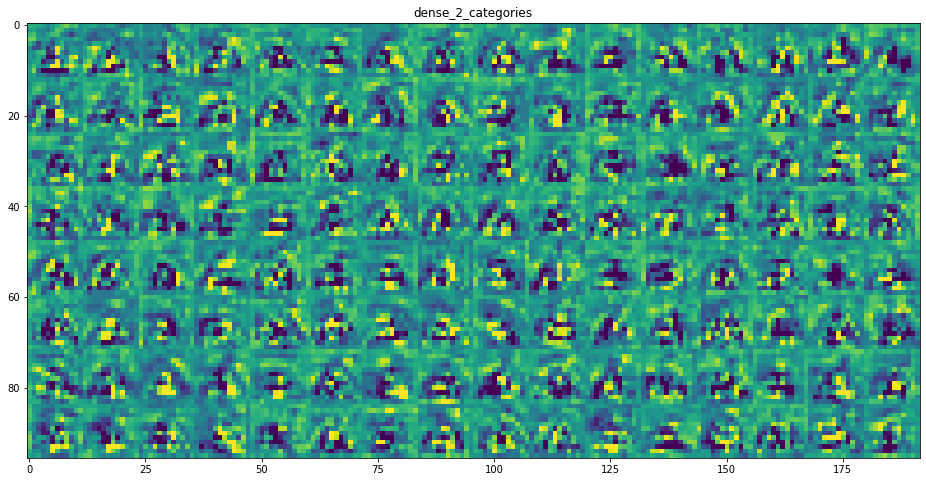

In [67]:
# Now let's display our feature maps for all layers
for layer_name, layer_activation in zip(layer_names[:9], activations):
    plot_each_layer(layer_name, layer_activation)

# Have a hardware limitation which runs out of memory after the first 9 layers. Hence splitting this into 2,
# although the results of visualization may not be accurate. 

# Have to break this up into 2 due to memory error
for layer_name, layer_activation in zip(layer_names[10:], activations):
    plot_each_layer(layer_name, layer_activation)    

block1_maxpool2d_1
(1, 25, 25, 32)


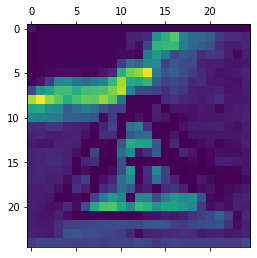

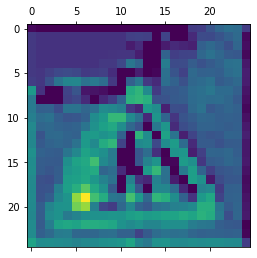

In [68]:
# Activation of another convolution layer for the image input
another_conv_layer_activation = activations[6]
print(layer_names[6])
print(another_conv_layer_activation.shape)

# Plotting the channel with index 10 of the activation of the max pool layer
plt.matshow(another_conv_layer_activation[0, :, :, 10], cmap='viridis')

# Plotting the channel with index 18 of the activation of the 1st layer of the original model
plt.matshow(another_conv_layer_activation[0, :, :, 18], cmap='viridis')

In [106]:
# # Now let's visualize a select set of filters from the convolutional layers


# for layer in traffic_model.layers:
#     if "conv" in layer.name: # filters apply only to convolutional layers
#         filters = layer.get_weights()
        
#         print(filters[0].shape)
        
#         # normalize filter values to 0-1 so we can visualize them
#         f_min, f_max = filters.min(), filters.max()
#         filters = (filters - f_min) / (f_max - f_min)
        
#         # plot first few filters
#         n_filters, ix = 6, 1
        
#         for i in range(n_filters):
#             # get the filter
#             f = filters[:, :, :, i]
            
#             # plot each channel separately
#             for j in range(3):
#                 # specify subplot and turn of axis
#                 ax = plt.subplot(n_filters, 3, ix)
#                 ax.set_xticks([])
#                 ax.set_yticks([])
#                 # plot filter channel in grayscale
#                 plt.imshow(f[:, :, j], cmap='gray')
#                 ix += 1
#         # show the figure
#         plt.show()


# #Select a convolutional layer
# layer = traffic_model.layers[0]

# #Get weights
# kernels = layer.get_weights()

# #Normalize kernels into [0, 1] range for proper visualization
# kernels = (kernels - np.min(kernels, axis=3)) / (np.max(kernels, axis=3) - np.min(kernels, axis=3))

# #Weights are usually (width, height, channels, num_filters)
# #Save weight images

# for i in range(kernels.shape[3]):
#     filter = kernels[:, :, :, i]
#     for j in range(3):
#         # specify subplot and turn of axis
#         ax = plt.subplot(6, 3, ix)
#         ax.set_xticks([])
#         ax.set_yticks([])
#         # plot filter channel in grayscale
#         plt.imshow(f[:, :, j], cmap='gray')
#         ix += 1
    

These filters help identify the features in the images and we'll see in the feature maps how well they are able to detect and classify signs.

In [73]:
# Next visualize feature maps

layer_name = layer_names[0]
filter_index = 0

layer_output = traffic_model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

# The call to `gradients` returns a list of tensors (of size 1 in this case)
# hence we only keep the first element -- which is a tensor.
grads = K.gradients(loss, traffic_model.input)[0]

# We add 1e-5 before dividing so as to avoid accidentally dividing by 0.
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

iterate = K.function([traffic_model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step


In [74]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [75]:
def generate_pattern(model, layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

In [76]:
# Generic function to plot a feature map, given a model and layername.    
def plot_feature_map_grid_for_layer(model, layername, rows=8, cols=8, size=64):
    margin = 5
    # This a empty (black) image where we will store our results.
    results = np.zeros((rows * size + 7 * margin, cols * size + 7 * margin, 3))

    for i in range(rows):  # iterate over the rows of our results grid
        for j in range(cols):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(model, layername, i*8 + j, size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.title(layername)
    plt.imshow(results)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


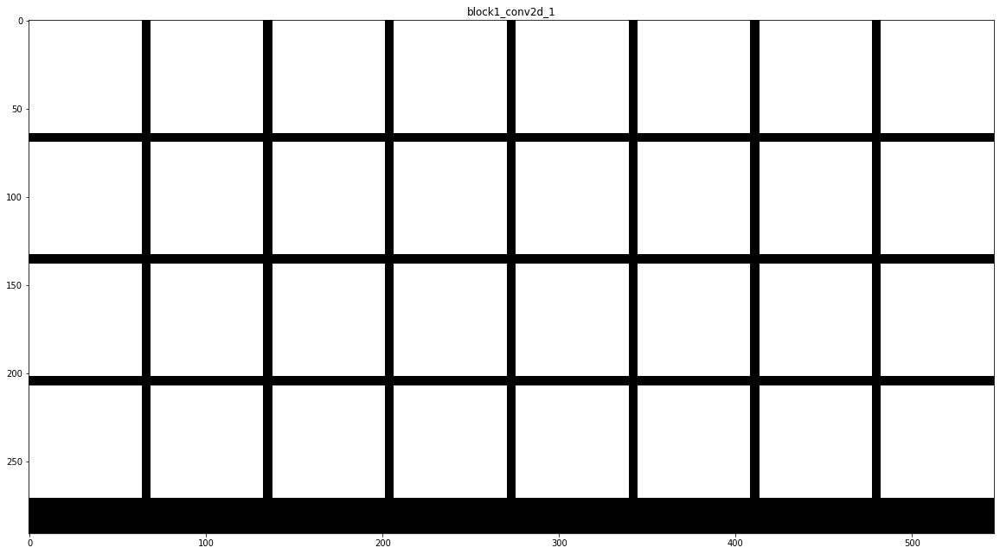

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


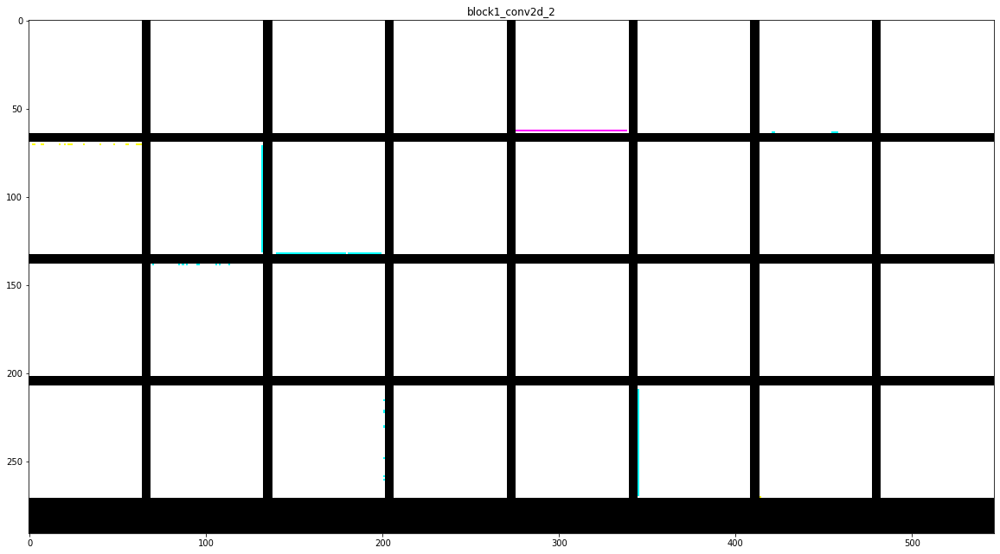

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


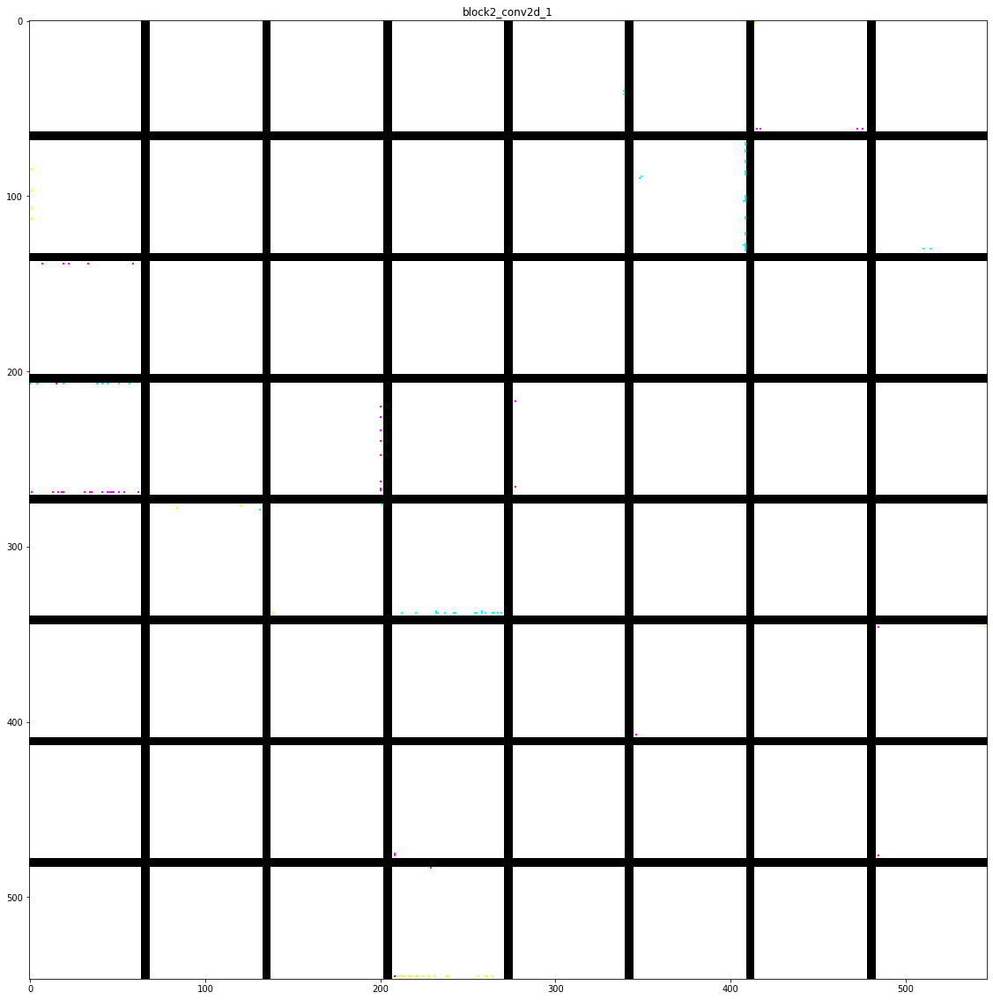

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


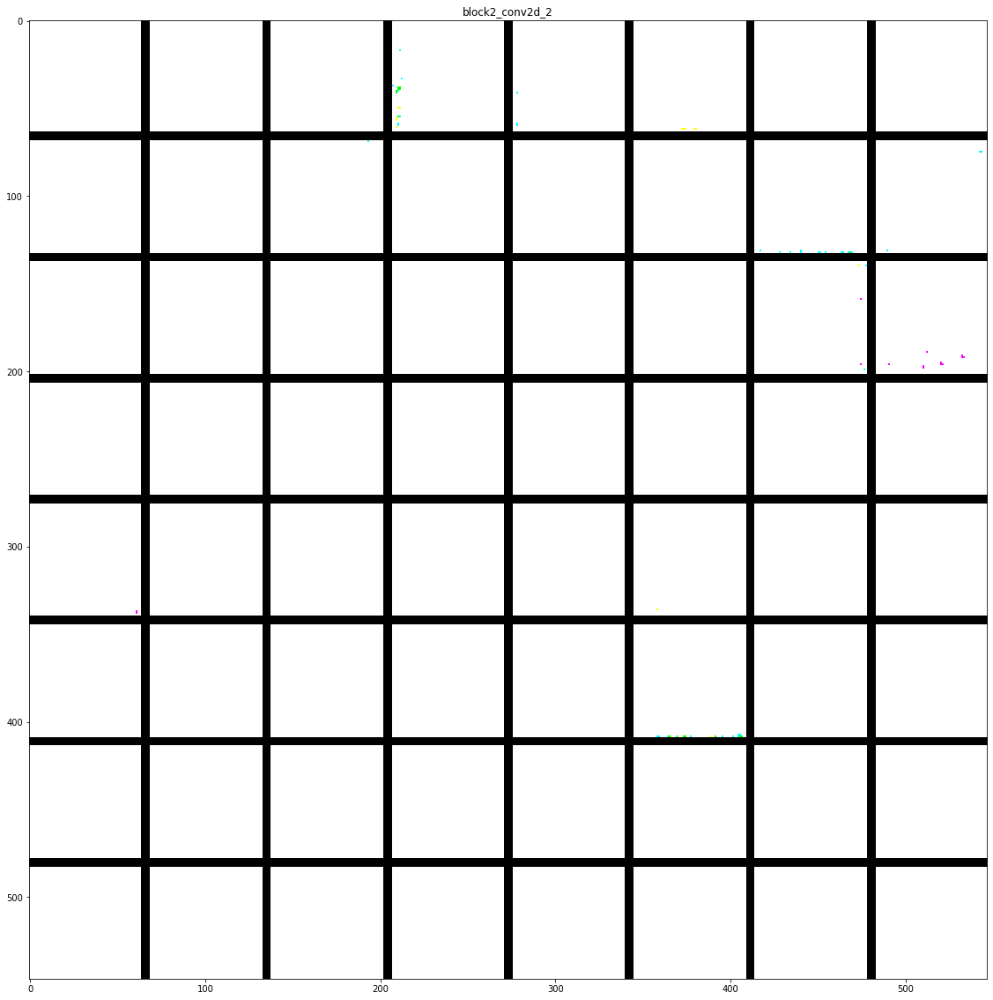

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


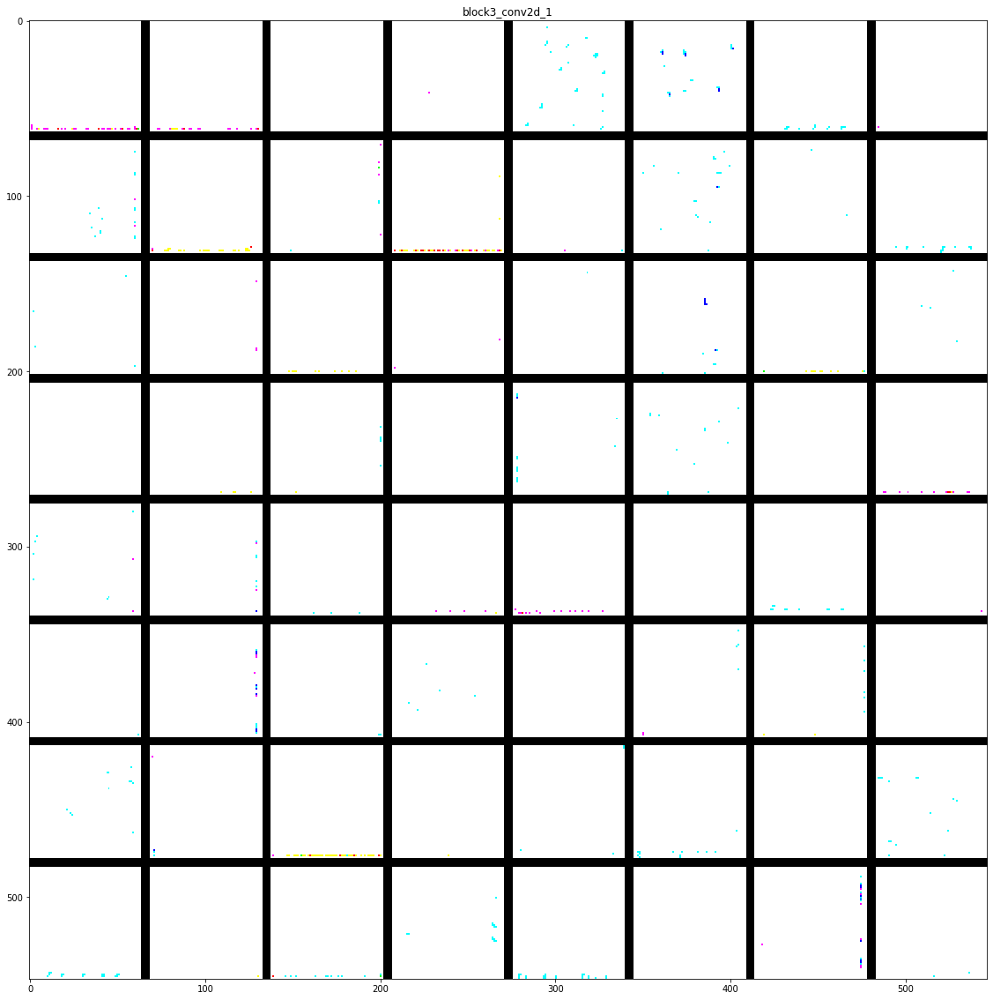

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


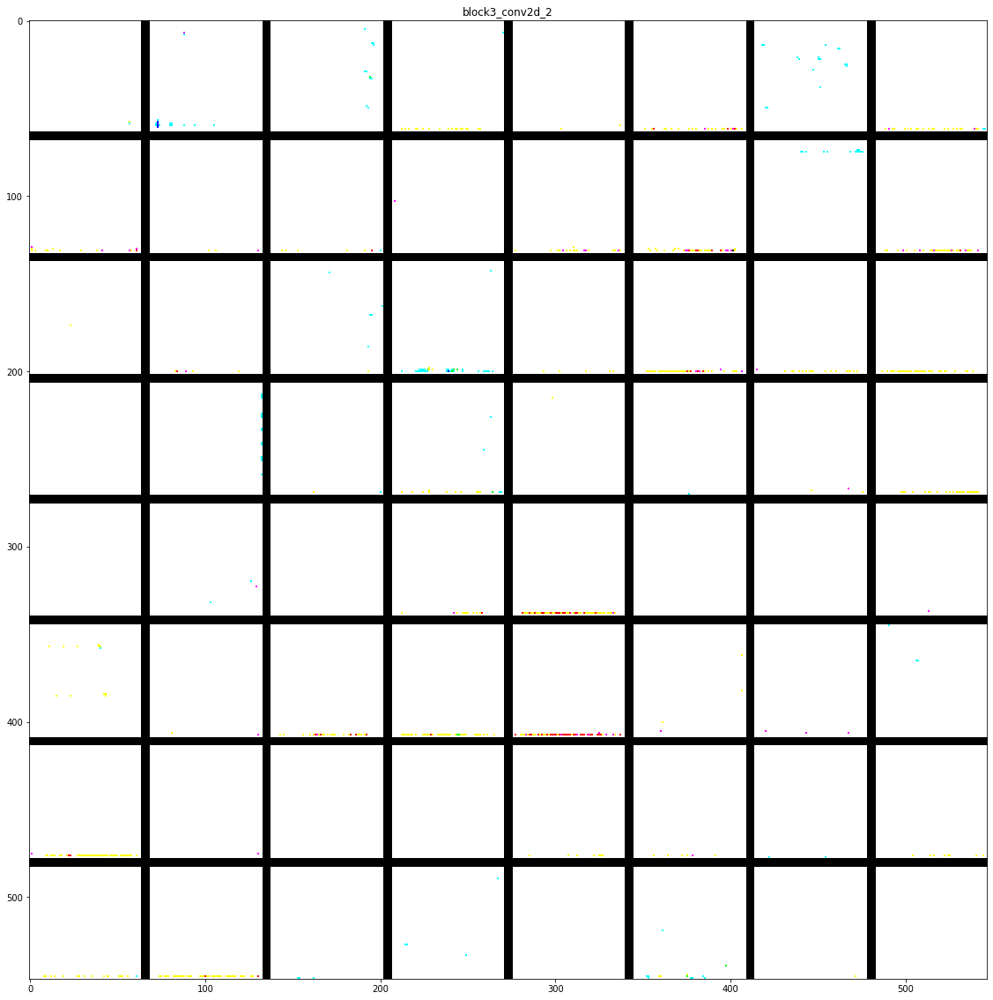

In [77]:
# Display feature maps for the convolutional layers
plot_feature_map_grid_for_layer(traffic_model, layer_names_conv[0], 4)
plot_feature_map_grid_for_layer(traffic_model, layer_names_conv[1], 4)
for layer_name in layer_names_conv[2:]:
    plot_feature_map_grid_for_layer(traffic_model, layer_name)

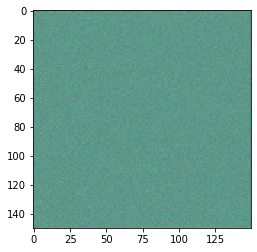

In [78]:
plt.imshow(generate_pattern(traffic_model, layer_names_conv[0], 8))
plt.show()

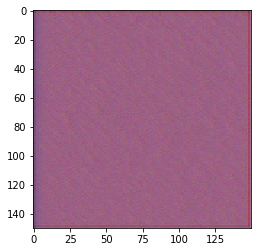

In [79]:
plt.imshow(generate_pattern(traffic_model, layer_names_conv[1], 18))
plt.show()

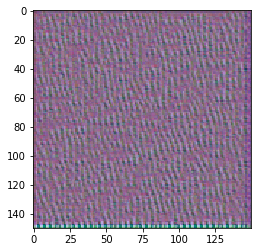

In [80]:
plt.imshow(generate_pattern(traffic_model, layer_names_conv[2], 15))
plt.show()

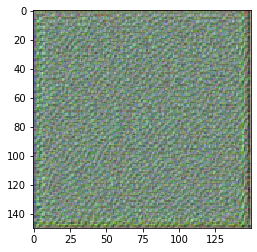

In [81]:
plt.imshow(generate_pattern(traffic_model, layer_names_conv[3], 47))
plt.show()

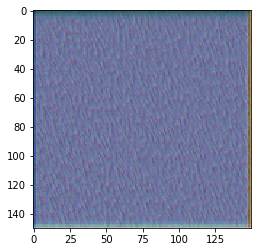

In [82]:
plt.imshow(generate_pattern(traffic_model, layer_names[4], 22))
plt.show()

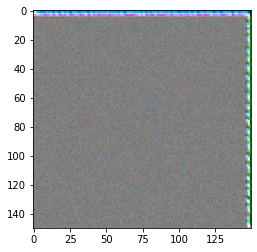

In [83]:
plt.imshow(generate_pattern(traffic_model, layer_names[5], 25))
plt.show()

(1, 50, 50, 3)


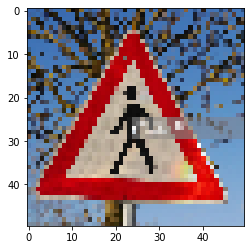

Prediction :  [27] Pedestrians


In [84]:
# Let's create a heatmap for a real pedestrian sign image from the Internet at 
# https://www.gettyimages.ca/detail/photo/german-traffic-signs-royalty-free-image/469763319.
img_path = 'ped.png'

img_tensor = classify_image(traffic_model, img_path, IMG_WIDTH, IMG_HEIGHT)

In [85]:
# The model correctly predicted that the symbol is for a pedestrian
# The pedestrian entry in the prediction vector
output = traffic_model.output[:,20]

# The is the output feature map of the last convolutional layer in the model
last_conv_layer = traffic_model.get_layer(layer_names_conv[-1])

# This is the gradient of the "african elephant" class with regard to
# the output feature map of `block5_conv3`
grads = K.gradients(output, last_conv_layer.output)[0]

# This is a vector of shape (512,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `block5_conv3`,
# given a sample image
iterate = K.function([traffic_model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of two elephants
pooled_grads_value, conv_layer_output_value = iterate(img_tensor)

# by "how important this channel is" with regard to the elephant class
for i in range(128):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

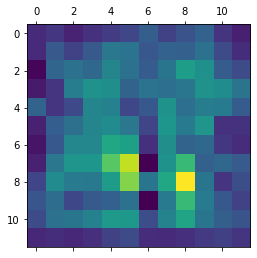

In [86]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [87]:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# # Save the image to disk
cv2.imwrite('ped_cam.png', superimposed_img)

True

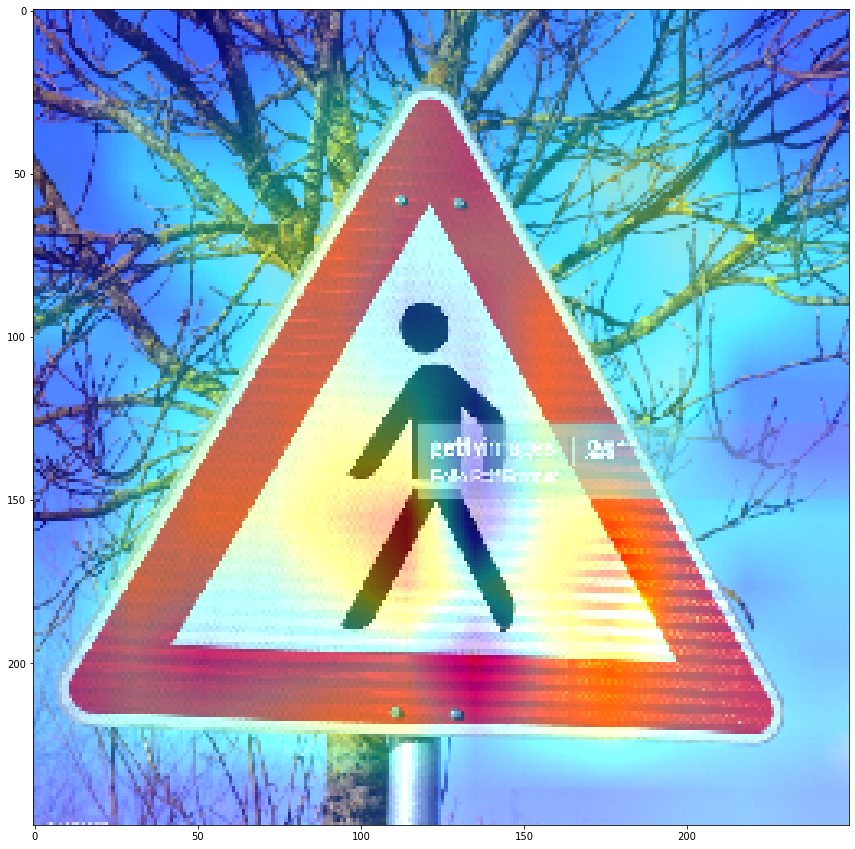

In [88]:
img_path = 'ped_cam.png'

img = image.load_img(img_path, target_size=(250, 250))

img_tensor = image.img_to_array(img)

img_tensor = np.expand_dims(img_tensor, axis=0)
    
img_tensor /= 255.

plt.figure(figsize=(15, 15))
plt.imshow(img_tensor[0])
plt.show()

While the prediction is accurate, the percentage of pedestrian signs accurately classified has not been consistent in my trial runs. It is clear from the heatmap that the neural network has not correctly observed what makes a pedestrian sign a pedestrian sign. The network likely needs more samples, both of the pedestrian sign and of signs from the confusion matrix of signs that the network thinks the pedestrian sign could be. 

(1, 50, 50, 3)


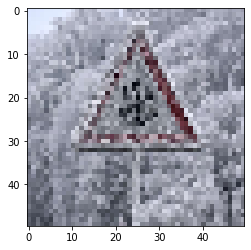

Prediction :  [25] Road work


In [89]:
# Because now is the other sign that had the most wrong predictions, let's get prediction of a real image 
# from the Internet at 
# http://darkroom.baltimoresun.com/2014/12/icy-weather-freezes-central-europe/germany-weather-snow-feature-5/
img_path = 'snow.png'

img_tensor = classify_image(traffic_model, img_path, IMG_WIDTH, IMG_HEIGHT)

This is a difficult image, given snow on it, but given the real life situation this sign is important when there is snow around. And the prediction is wrong. The neural network could use more examples to notice the differences between the prediction and the ground truth

(1, 50, 50, 3)


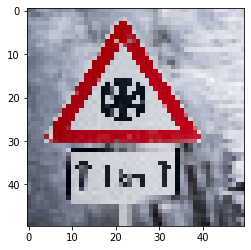

Prediction :  [2] Speed Limit 50 km/h


In [90]:
# Trying with another image of the same snow sign -
img_path = 'snow1.png'

img_tensor = classify_image(traffic_model, img_path, IMG_WIDTH, IMG_HEIGHT)

Data augmentation with the training set, and expanding the number of images for classes with small sample sizes would be the next step. 

# Tuning Hyperparameters  

This is a review of hyperparameters after passing the test data through the model. Hence evaluating against test data, rather than validation set. 
  
Several interesting research papers about this topic, one of which at https://arxiv.org/abs/1803.09820 was a useful guide. 

In [91]:
# Before figuring out the optimal hyperparameters, look at what's the current one
print("Default learning rate: ", K.eval(traffic_model.optimizer.lr))
print("Default weight decay rate: ", K.eval(traffic_model.optimizer.decay))

Default learning rate:  0.001
Default weight decay rate:  0.0


# Best Optimizer For Above CNN
  
While Adam appears to be a good choice, the question is whether any of the other options at https://www.tensorflow.org/api_docs/python/tf/keras/optimizers are worth the effort to adapt to


In [92]:
# Generic function to compare optimzer performance
def fit_model_optimizers(train_datagen, train_df, validation_df, optimizer):
    # Iterators to prepare dataset
    train_generator, validation_generator = create_train_validation_generators(
        train_datagen, train_df, validation_df)
    # Create the traffic model
    model = create_traffic_model_simple()
    # Vary the optimizer
    model.compile(optimizer=optimizer, 
                      loss="categorical_crossentropy", # for the more than binary classifier
                      metrics=["accuracy"]) 
    # Set up parameters for training and validation in the fit function
    step_size_train=train_generator.n//train_generator.batch_size
    step_size_valid=validation_generator.n//validation_generator.batch_size
    epochs = 20
    history = model.fit(train_generator,
                        validation_data=validation_generator,
                        steps_per_epoch=step_size_train,
                        validation_steps=step_size_valid,
                        epochs=epochs,
                        verbose=0
                       )
    return history

In [93]:
# Create accuracy curves for different optimizers
epochs = 20
optimizers = ['sgd', 'rmsprop', 'adadelta', 'adagrad', 'adamax', 'ftrl', 'adam', 'nadam']
histories_optimizers = []
for i in range(len(optimizers)):
    # fit model and plot learning curves for an optimizer
    hist = (fit_model_optimizers(train_datagen, train_df, validation_df, optimizers[i]))
    histories_optimizers.append(hist)

Found 31367 validated image filenames belonging to 43 classes.
Found 7842 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 7842 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 7842 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 7842 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 7842 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 7842 validated image filenames belonging to 43 classes.


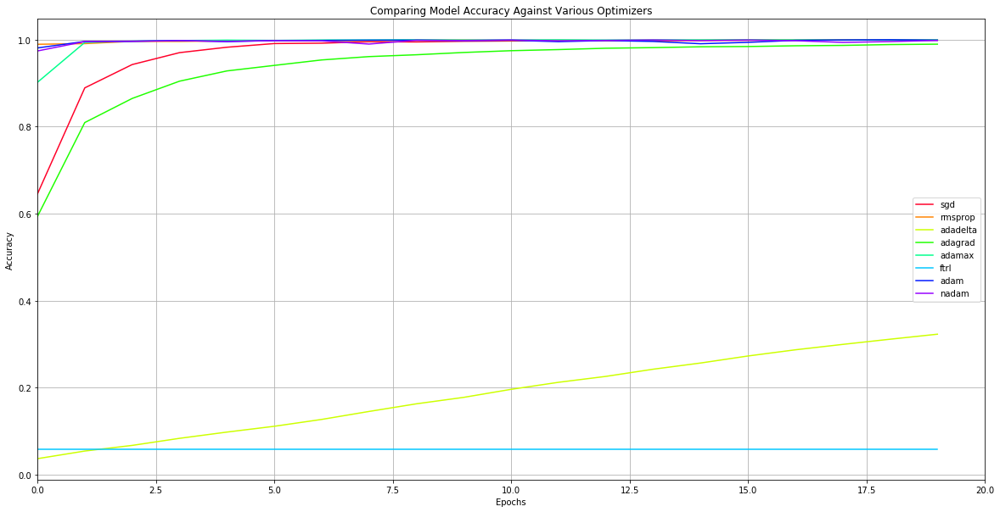

In [94]:
fig = plt.figure(figsize=(20,10))
NUM_COLORS = len(optimizers)
cm = plt.get_cmap('gist_rainbow')
ax = fig.add_subplot()
ax.set_prop_cycle(color=[cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)])
# show learning curves
for i in range(len(optimizers)):
    plt.plot(range(epochs), histories_optimizers[i].history['val_accuracy'], label=optimizers[i])
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.xlim([0, epochs])
plt.ylabel('Accuracy')
plt.grid(True)
plt.title("Comparing Model Accuracy Against Various Optimizers")
plt.show()
fig.savefig('comparing-optimizers.jpg')


# Optimum Learning Rate  

Learning rate is likely the most important hyperparameter - If too small, overfitting may happen. If too large, training may diverge. Ideally, use a range to test and balance regularization.

In [95]:
# Generic function to compare optimzer performance
def fit_model_learning_rate(train_datagen, train_df, validation_df, learning_rate):
    # Iterators to prepare dataset
    train_generator, validation_generator = create_train_validation_generators(
        train_datagen, train_df, validation_df)
    # Create the traffic model
    model = create_traffic_model_simple()
    # Vary the optimizer
    optimizer=Adam(lr=learning_rate)
    model.compile(optimizer=optimizer, # Applying different learning rates 
                  loss="categorical_crossentropy", # for the more than binary classifier
                  metrics=["accuracy"]) 
    # Set up parameters for training and validation in the fit function
    step_size_train=train_generator.n//train_generator.batch_size
    step_size_valid=validation_generator.n//validation_generator.batch_size

    epochs = 20
    history = model.fit(train_generator,
                        validation_data=validation_generator,
                        steps_per_epoch=step_size_train,
                        validation_steps=step_size_valid,
                        epochs=epochs,
                        verbose=0
                       )
    return history

In [96]:
# Create accuracy curves for different optimizers
epochs = 20
learning_rates = [1E-0, 1E-1, 1E-2, 1E-3, 1E-4, 1E-5, 1E-6, 1E-7]
histories_learning_rates = []
for i in range(len(learning_rates)):
    # fit model and plot learning curves for an optimizer
    hist = (fit_model_learning_rate(train_datagen, train_df, test_df, learning_rates[i]))
    histories_learning_rates.append(hist)

Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 cla

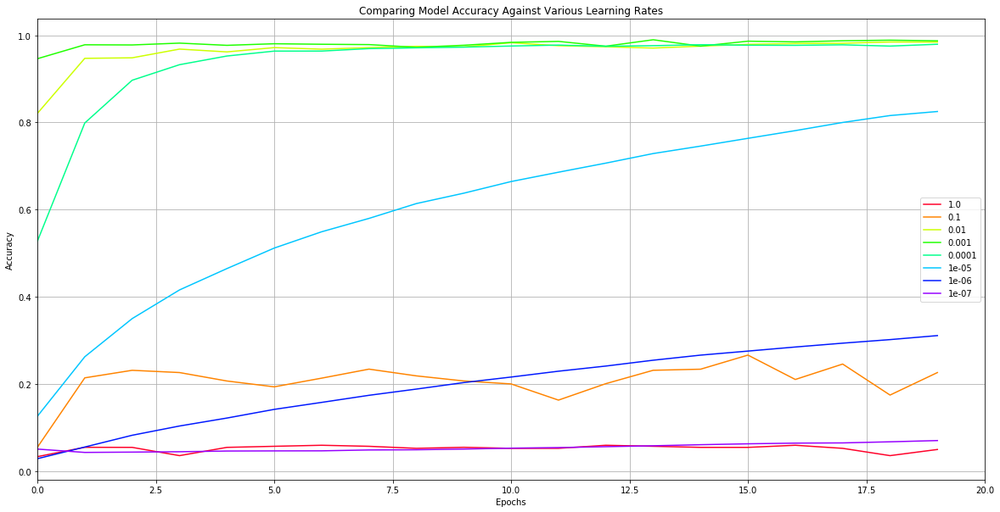

In [97]:
# show learning curves
fig = plt.figure(figsize=(20,10))
NUM_COLORS = len(learning_rates)
cm = plt.get_cmap('gist_rainbow')
ax = fig.add_subplot()
ax.set_prop_cycle(color=[cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)])
for i in range(len(learning_rates)):
    plt.plot(range(epochs), histories_learning_rates[i].history['val_accuracy'], label=learning_rates[i])
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.xlim([0, epochs])
plt.ylabel('Accuracy')
plt.grid(True)
plt.title("Comparing Model Accuracy Against Various Learning Rates")
plt.show()
fig.savefig('comparing-learning-rates.jpg')

# Optimum Weight Decay
  
Weight decay is a type of regularization valuable during training. Choosing the optimum decay rate gets to the best training outcomes.  

In [98]:
# Generic function to compare performance
def fit_model_weight_decay(train_datagen, train_df, validation_df, weight_decay):
    # Iterators to prepare dataset
    train_generator, validation_generator = create_train_validation_generators(
        train_datagen, train_df, validation_df)
    # Create the traffic model
    model = create_traffic_model_simple()
    # Vary the optimizer
    optimizer=Adam(decay=weight_decay) # Using default learning rate of 0.001 as it turns out to be optimal
    model.compile(optimizer=optimizer, # Applying different learning rates 
                  loss="categorical_crossentropy", # for the more than binary classifier
                  metrics=["accuracy"]) 
    # Set up parameters for training and validation in the fit function
    step_size_train=train_generator.n//train_generator.batch_size
    step_size_valid=validation_generator.n//validation_generator.batch_size
    
    epochs = 20
    history = model.fit(train_generator,
                        validation_data=validation_generator,
                        steps_per_epoch=step_size_train,
                        validation_steps=step_size_valid,
                        epochs=epochs,
                        verbose=0
                       )
    return history

In [99]:
# Create accuracy curves for different weight decay rates
epochs = 20
decay_rates = [1E-1, 1E-2, 1E-3, 1E-4, 0.]
histories_decay_rates = []
for i in range(len(decay_rates)):
    # fit model and plot learning curves for an optimizer
    hist = (fit_model_weight_decay(train_datagen, train_df, test_df, decay_rates[i]))
    histories_decay_rates.append(hist)

Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Found 31367 validated image filenames belonging to 43 classes.
Found 12630 validated image filenames belonging to 43 classes.
  ...
    to  
  ['...']
  ...
    to  
  ['...']


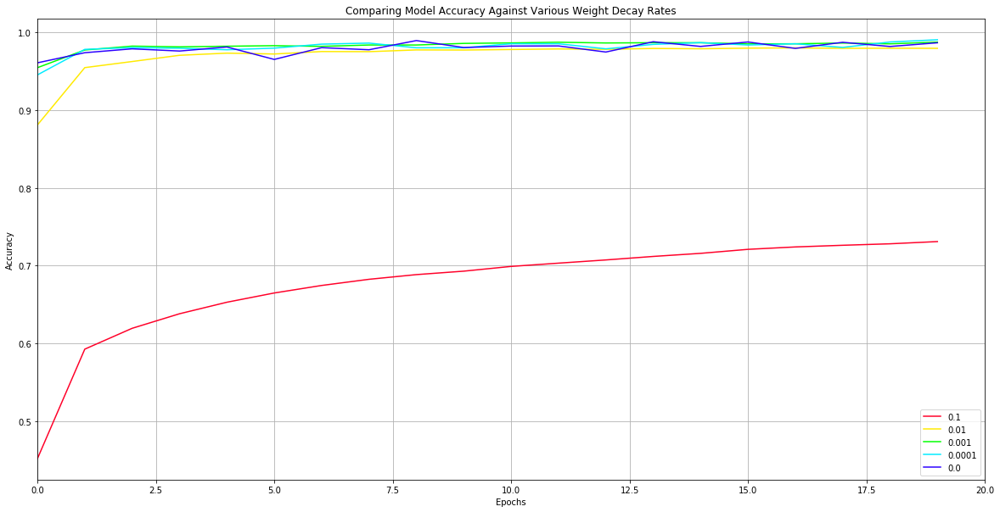

In [100]:
# show learning curves
fig = plt.figure(figsize=(20,10))
NUM_COLORS = len(decay_rates)
cm = plt.get_cmap('gist_rainbow')
ax = fig.add_subplot()
ax.set_prop_cycle(color=[cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)])
for i in range(len(decay_rates)):
    plt.plot(range(epochs), histories_decay_rates[i].history['val_accuracy'], label=decay_rates[i])
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.xlim([0, epochs])
plt.ylabel('Accuracy')
plt.grid(True)
plt.title("Comparing Model Accuracy Against Various Weight Decay Rates")
plt.show()
fig.savefig('comparing-weight-decay.jpg')


# Optimal Batch Sizes

Batch size can affect underfitting Vs overfitting balance. Small batch sizes create regularization effect. Larger batch sizes may reach optimal learning faster. To simplify comparison, I'll compare how many epochs each one lasts while reaching highest accuracy.

In [101]:
# Generic function to create iterators for training and validation from the train_datagen

def create_train_validation_generators_batch_size_experiment(idg, tdf, vdf, batch_size):    
    tg = idg.flow_from_dataframe(
        dataframe=tdf,
        directory=dataset_dir,
        x_col='Path',
        y_col='ClassId',
        batch_size=batch_size,
        seed=SEED_VALUE,
        shuffle=True,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode='rgb',
        class_mode='categorical'
    )

    vg = idg.flow_from_dataframe(
        dataframe=vdf,
        directory=dataset_dir,
        x_col='Path',
        y_col='ClassId',
        batch_size=batch_size,
        seed=SEED_VALUE,
        shuffle=True,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode='rgb',
        class_mode='categorical'
    )
    
    return tg, vg

In [104]:
# Generic function to compare performance
def fit_model_batch_sizes(train_datagen, train_df, validation_df, batch_size):
    # Iterators to prepare dataset
    BATCH_SIZE=batch_size
    train_generator, validation_generator = create_train_validation_generators_batch_size_experiment(
        train_datagen, train_df, validation_df, batch_size)
    # Create the traffic model
    model = create_traffic_model_simple()
    # Vary the optimizer
    optimizer=Adam() # Using default learning rate of 0.001 and weight decay as they turn out to be optimal
    model.compile(optimizer=optimizer, # Applying different learning rates 
                  loss="categorical_crossentropy", # for the more than binary classifier
                  metrics=["accuracy"]) 
    # Set up parameters for training and validation in the fit function
    step_size_train=train_generator.n//train_generator.batch_size
    step_size_valid=validation_generator.n//validation_generator.batch_size
    # We are going to set up a large number of epochs with early stopping to compare the batch sizes
    early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto')
    epochs = 50
    history = model.fit(train_generator,
                        validation_data=validation_generator,
                        steps_per_epoch=step_size_train,
                        validation_steps=step_size_valid,
                        epochs=epochs,
                        callbacks=[early_stopping],
                        verbose=0
                       )
    return history

In [107]:
# Create accuracy curves for different optimizers
epochs = 20
batch_sizes = [1024, 512, 256, 128, 64, 32, 16]
histories_batch_sizes = []
for i in range(len(batch_sizes)):
    # fit model and plot learning curves for an optimizer
    hist = (fit_model_batch_sizes(train_datagen, train_df, test_df, batch_sizes[i]))
    histories_batch_sizes.append(hist)
# Setting back to original size for any additional work

In [ ]:
fig = plt.figure(figsize=(20,10))
NUM_COLORS = len(batch_sizes)
cm = plt.get_cmap('gist_rainbow')
ax = fig.add_subplot()
ax.set_prop_cycle(color=[cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)])
for i in range(len(batch_sizes)):
    plt.plot(range(len(histories_batch_sizes[i].history['val_accuracy'])),
             histories_batch_sizes[i].history['val_accuracy'],
             label=str(batch_sizes[i]))
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.xlim([0,epochs])
plt.ylabel('Accuracy')
plt.grid(True)
plt.title("Comparing Model Accuracy for Batch Sizes")
plt.show()


The chosen batch size of 64 appears like a good balance between performance and time.

# Data Augmentation 

Attempting on the fly Data Augmentation using ImageDataGenerator.  
**Update: After several attempts, observation shows that there's some bug or nuance in flow_from_directory as model.fit gets one batch at a time, that the samples are oddly worse balanced than the original set. Due to lack of time on the 2 week project, will debug this later.**

In [ ]:
# augmented_train_datagen = ImageDataGenerator(
#     rescale=1./255,
#     featurewise_center=True,
#     featurewise_std_normalization=True,
#     horizontal_flip=False,
#     vertical_flip=False,
#     rotation_range=10,
#     zoom_range=0.1,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     channel_shift_range=0.1,
#     brightness_range = (0.9,1.1),
#     fill_mode='nearest'
# )
#
# augmented_train_generator, augmented_validation_generator = create_train_validation_generators(
#     augmented_train_datagen, train_df, validation_df)

In [ ]:
# (_, _) = display_imagedatagenerator_samples(augmented_train_generator)

In [ ]:
# (_, _) = display_imagedatagenerator_samples(augmented_validation_generator)

In [ ]:
# augmented_traffic_model = create_traffic_model_simple()

# augmented_traffic_model.summary()

# augmented_traffic_model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])


# AUGMENTED_STEP_SIZE_TRAIN=augmented_train_generator.n//augmented_train_generator.batch_size
# AUGMENTED_STEP_SIZE_VALID=augmented_validation_generator.n//augmented_validation_generator.batch_size

In [ ]:
# # We are going to set up a large number of epochs with early stopping
# early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto')
# EPOCHS = 50

# augmented_history = traffic_model.fit(augmented_train_generator,
#                             validation_data=augmented_validation_generator,
#                             steps_per_epoch=AUGMENTED_STEP_SIZE_TRAIN,
#                             validation_steps=AUGMENTED_STEP_SIZE_VALID,
#                             epochs=EPOCHS,
#                             callbacks=[early_stopping]
#                            )

# augmented_traffic_model.save('augmented_traffic_model.h5')

In [ ]:
# plot_history(augmented_history)

In [ ]:
# test_generator.reset()
# augmented_score = augmented_traffic_model.evaluate(test_generator, verbose=1)
# print('Test dataset accuracy: {}'.format(augmented_score[1]))

In [ ]:
# augmented_full_y_predictions_batch = augmented_traffic_model.predict(full_x_test_batch)

# augmented_full_y_predictions_batch.shape


In [ ]:
# # Mark the correct and wrong predictions, then move into a dataframe for easier manipulation and plotting
# augmented_full_test_results = []

# for i in range(test_df.shape[0]):
#     prediction = np.argmax(augmented_full_y_predictions_batch[i])
#     groundtruth = np.argmax(full_y_test_batch[i])
#     sample_result = {'image': full_x_test_batch[i], 
#                    'prediction': int(prediction), 
#                    'groundtruth': int(groundtruth),
#                    'result': 'Correct' if int(prediction) == int(groundtruth) else 'Wrong'}
#     augmented_full_test_results.append(sample_result)
    
# augmented_full_test_results_df = pd.DataFrame(augmented_full_test_results)

# augmented_full_test_results_df.head()

In [ ]:
# # What % of predictions are wrong?
# fig, axs = plt.subplots(1, 1, sharex=False, sharey=True, figsize=(25, 7))

# px = sns.countplot(x='result', data=augmented_full_test_results_df, ax=axs)
# axs.set_title('Prediction type distribution', fontsize=30)
# axs.set_xlabel('Prediction type', fontsize=16)
# axs.set_ylabel('Fraction', fontsize=16);


# augmented_total = augmented_full_test_results_df.shape[0]
# for idx, p in enumerate(px.patches):
#         px.annotate('{:.1f}%'.format(p.get_height()/augmented_total*100), (p.get_x()+0.365, p.get_height()+100), fontsize=18)


# px.yaxis.set_ticks(np.linspace(0, total, 11))
# px.set_yticklabels(map('{:.1f}%'.format, 100*px.yaxis.get_majorticklocs()/augmented_total));



# augmented_test_samples_by_class_df = plot_correct_wrong_train_test(augmented_full_test_results_df, train_df)


In [ ]:
# # Wrong predictions only -

# rows = 12
# cols = 4
# fig, axs = plt.subplots(rows, cols, figsize=(IMG_WIDTH, IMG_HEIGHT))

# f_df = augmented_full_test_results_df[augmented_full_test_results_df['result'] == 'Wrong'].copy()

# idx = 0
# for i in range(rows):
#     for j in range(cols):       
#         groundtruth = f_df.iloc[idx]['groundtruth']
#         prediction = f_df.iloc[idx]['prediction']
        
#         axs[i,j].imshow(f_df.iloc[idx]['image'])
#         axs[i,j].set_title('P: {}\nG: {}'.format(class_names[prediction], 
#                                                                     class_names[groundtruth]), fontsize=40)
#         axs[i,j].get_xaxis().set_visible(False)
#         axs[i,j].get_yaxis().set_visible(False)
#         idx += 1
        
# fig.suptitle("Studying Only Wrong Predictions - P=Prediction G=GroundTruth", fontsize=60, y=2.1, x=0.515)
# plt.subplots_adjust(left=None, bottom=None, right=0.9, top=1.9, wspace=None, hspace=None)
